In [1]:
import numpy as np
import matplotlib.pyplot as plt

from LFC.Hardware.TDS2024C import TDS2024C
osc = TDS2024C()
osc.connect()

from LFC.Hardware.AndoOSA_AQ6315E import AndoOSA_AQ6315E
osa = AndoOSA_AQ6315E()
osa.connect()

from LFC.Hardware.SRS_SIM900 import SRS_SIM900, SRS_PIDcontrol_SIM960, SRS_VoltSorc_SIM928
srs = SRS_SIM900(addr='ASRL21::INSTR')
srs.connect()
servo1 = SRS_PIDcontrol_SIM960(srs,1,name="SIM960 1st")
servo2 = SRS_PIDcontrol_SIM960(srs,3,name="Power lock to IM DCbias")
servo3 = SRS_PIDcontrol_SIM960(srs,5,name="SIM960 3rd")

from LFC.KeckLFC import KeckLFC
lfc = KeckLFC(amamp_addr = 'ASRL13::INSTR', amamp_name = 'Amonic 23dbm EDFA',#'Amonic 6A 680mW EDFA',
              ptamp_addr = 'ASRL6::INSTR', ptamp_name = 'Pritel 3.85A 3.6W FA',
              RFoscPS_addr = 'ASRL5::INSTR', RFoscPS_name = 'RF oscillator Power Supply 15V 0.4A',
              RFampPS_addr = 'ASRL10::INSTR', RFampPS_name = 'RF amplifier Power Supply 30V 4.5A',
              rbclock_addr = 'ASRL9::INSTR', rbclock_name = 'FS725 Rubidium Frequency Standard')

lfc.connect_all()

from LFC.Hardware.ORIONLaser import ORIONLaser
rio = ORIONLaser(addr='ASRL12::INSTR')
rio.connect()
rio.readFirmwareVersion()

TDS2024C OSC connected
ANDO AQ-6315E Optical Spectrum Analyzer connected
Stanford Research System SIM900 connected
Amonic 23dbm EDFA connected
Amonic 13dbm EDFA connected
Pritel 3.85A 3.6W FA connected
RF amplifier Power Supply 30V 4.5A connected
RF oscillator Power Supply 15V 0.4A connected
FS725 Rubidium Frequency Standard connected
Finisar Waveshaper SN201904 connected
ORION Laser Module connected


'0.11.7'

In [108]:
# lfc.ptamp.ramp_pwr_ma=100
# lfc.ptamp.pwrAmp = 0
# lfc.ptamp.preAmp = 0
# lfc.ptamp.activation=0
# import time
# time.sleep(3)
# lfc.amamp2.activation=0

In [21]:
# lfc.ptamp.pwrAmp = 0
# lfc.ptamp.preAmp = 0
# lfc.ptamp.activation = 0
lfc.amamp2.activation = 0
lfc.amamp2.accCh1Status = 0
lfc.amamp.activation = 0
lfc.amamp.accCh2Status = 0
lfc.amamp.accCh1Status = 0

lfc.RFampPS.activation1 = 0
lfc.RFoscPS.activation = 0

Amonic 13dbm EDFA: ......waiting Activation status set to OFF, now ON
Amonic 13dbm EDFA: setted Activation status as OFF, finished in 0.078 seconds
Amonic 13dbm EDFA: ......waiting ACC CH1 status set to OFF, now ON
Amonic 13dbm EDFA: setted ACC CH1 status as OFF, finished in 0.100 seconds
Amonic 23dbm EDFA: ......waiting Activation status set to OFF, now ON
Amonic 23dbm EDFA: setted Activation status as OFF, finished in 0.080 seconds
Amonic 23dbm EDFA: ......waiting ACC CH2 status set to OFF, now ON
Amonic 23dbm EDFA: setted ACC CH2 status as OFF, finished in 0.080 seconds
Amonic 23dbm EDFA: ......waiting ACC CH1 status set to OFF, now ON
Amonic 23dbm EDFA: setted ACC CH1 status as OFF, finished in 0.080 seconds
RF amplifier Power Supply 30V 4.5A: channel 1 output is turned OFF
Instek GPD-4303S DCSupply: Output activation is turned OFF.


In [20]:
import time
lfc.RFoscPS.activation = 1
time.sleep(10)
lfc.RFampPS.activation1 = 1

lfc.amamp.accCh1Status = 1
lfc.amamp.accCh2Status = 1
lfc.amamp.activation = 1

time.sleep(10)
lfc.amamp2.accCh1Status = 1
lfc.amamp2.activation = 1

# lfc.ptamp.activation = 1
# time.sleep(3)
# lfc.ptamp.ramp_pwr_ma=50
# lfc.ptamp.preAmp = '00mA'
# lfc.ptamp.pwrAmp = '0.A'

Instek GPD-4303S DCSupply: Output activation is turned ON.
RF amplifier Power Supply 30V 4.5A: channel 1 output is turned ON
Amonic 23dbm EDFA: setted ACC CH1 status as ON, finished in 0.040 seconds
Amonic 23dbm EDFA: setted ACC CH2 status as ON, finished in 0.033 seconds
Amonic 23dbm EDFA: ACTIVATING LASER OUTPUT, MAKE SURE SEED INPUT POWER IS APPROPRIATE TO AVOID DAMAGE
Amonic 23dbm EDFA: setted Activation status as ON, finished in 0.030 seconds
Amonic 13dbm EDFA: ......waiting ACC CH1 status set to ON, now OFF
Amonic 13dbm EDFA: setted ACC CH1 status as ON, finished in 0.080 seconds
Amonic 13dbm EDFA: ACTIVATING LASER OUTPUT, MAKE SURE SEED INPUT POWER IS APPROPRIATE TO AVOID DAMAGE
Amonic 13dbm EDFA: ......waiting Activation status set to ON, now OFF
Amonic 13dbm EDFA: setted Activation status as ON, finished in 0.080 seconds


In [97]:
# lfc.wsp.set3rdDisper(d2=2.01, d3= -0.0, preview_plot=0)
# lfc.wsp.setBandPass(span=5)# ws.plotStatus()
# lfc.wsp.writeProfile()

Waveshaper Set 3rd disper with d2=2.3 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_tests\\Paul1.0m_ACint_10fs_disp2_2.300_biaV_0.825_pwr_3.78_A_1pulse.mat


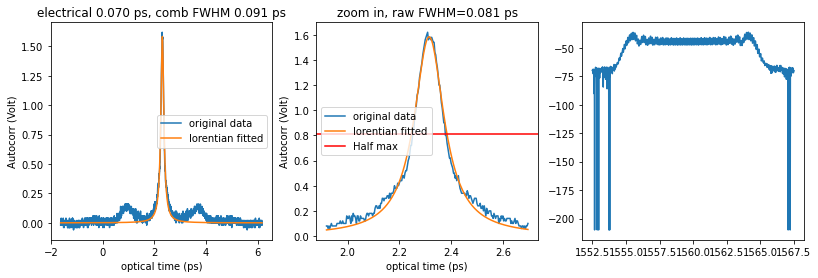

In [70]:
filedir = r"Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_tests\\"
disp2 = 2.3
lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
lfc.wsp.setBandPass(span=5)# ws.plotStatus()

# lfc.ptamp.ramp_pwr_ma = 500
# lfc.ptamp.pwrAmp = 0
# lfc.ptamp.preAmp = 0

lfc.wsp.writeProfile()

# lfc.ptamp.ramp_pwr_ma=100
# lfc.ptamp.preAmp = '600mA'
# lfc.ptamp.pwrAmp = '3.8A'


filename = f"Paul1.0m_ACint_10fs_disp2_{disp2:.3f}_biaV_{servo2.output_voltage:.3f}_pwr_{lfc.ptamp.pwrAmp/1000:.2f}_A"
spec = osa.get_trace('c', plot=False)

pw,_, fig, raw_pw = osc.get_autocorr_FWHM_single(filename=filedir+filename+f"_1pulse.mat",
                    fit_range=250,
                    additional_plotdata=spec)

In [3]:
# np.linspace(1.95, 2.35, 41)

Waveshaper Set 3rd disper with d2=1.95 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:167: UserWarning: TDS2024C OSC: Directory Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W does not exist. Creating new directory.
  warnings.warn(self.devicename+": Directory "+filedir+" does not exist. Creating new directory.")


TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.950_biaV_0.823_pwr_3.79_A_1.mat


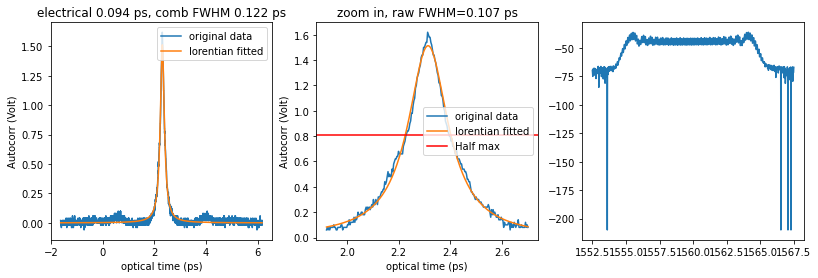

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.950_biaV_0.823_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

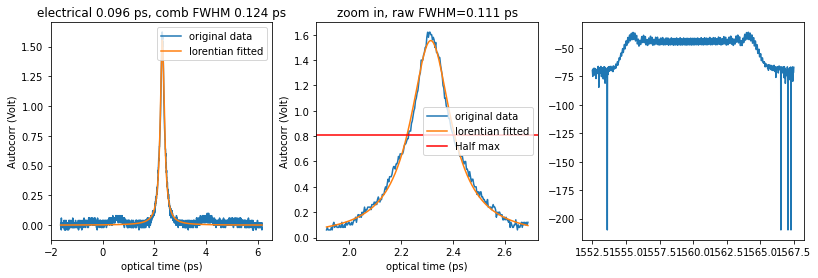

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.950_biaV_0.823_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

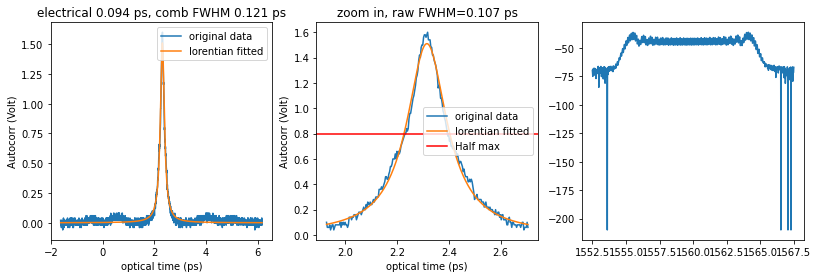

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.950_biaV_0.823_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

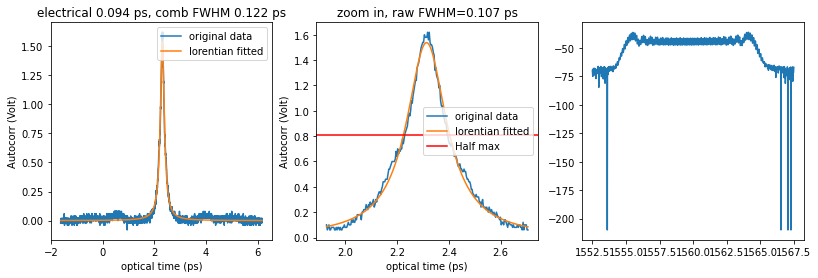

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.950_biaV_0.823_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

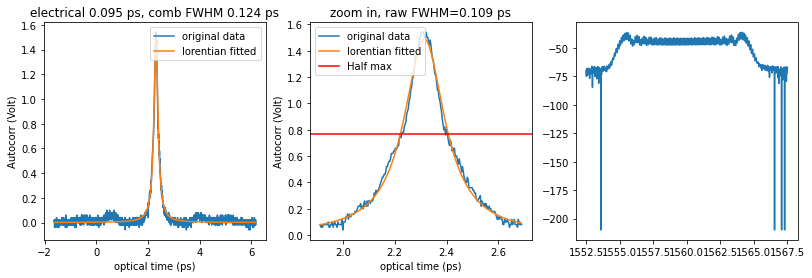

Waveshaper Set 3rd disper with d2=1.96 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.960_biaV_0.823_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

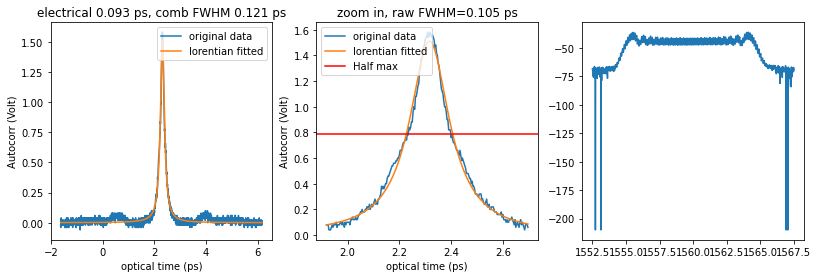

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.960_biaV_0.823_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

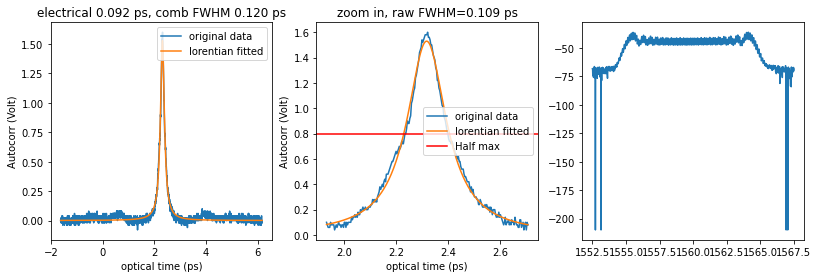

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.960_biaV_0.823_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

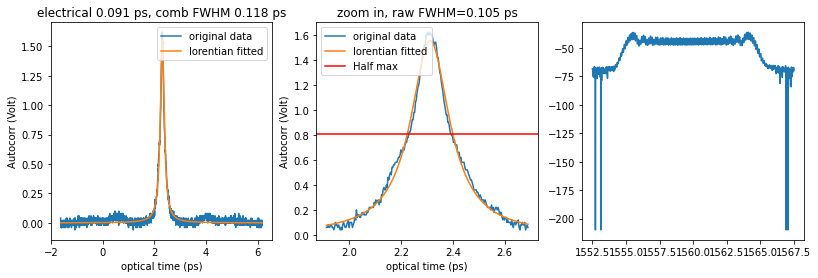

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.960_biaV_0.823_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

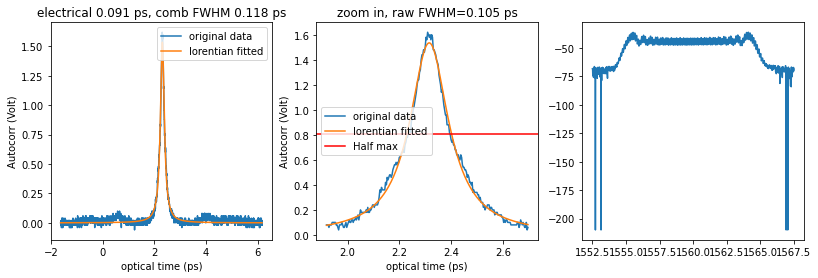

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.960_biaV_0.823_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

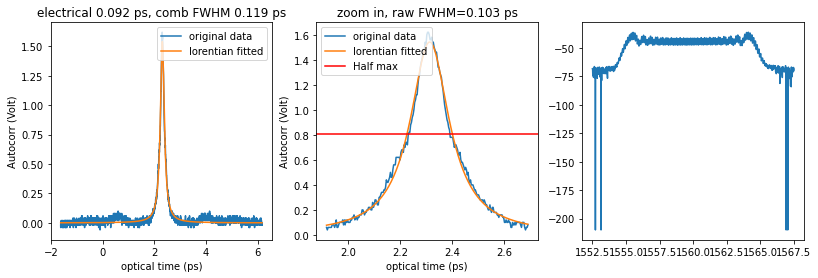

Waveshaper Set 3rd disper with d2=1.97 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.970_biaV_0.824_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

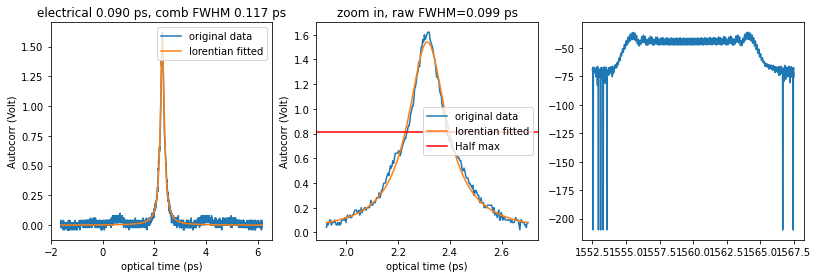

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.970_biaV_0.824_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

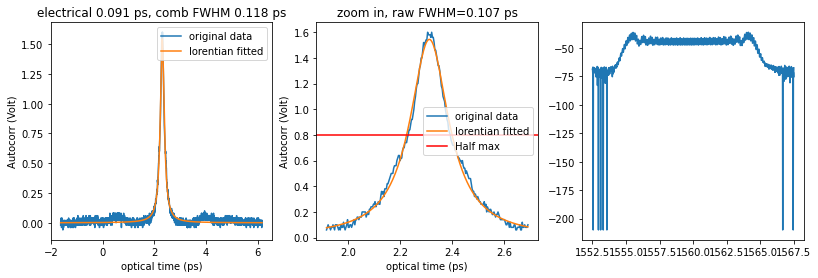

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.970_biaV_0.824_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

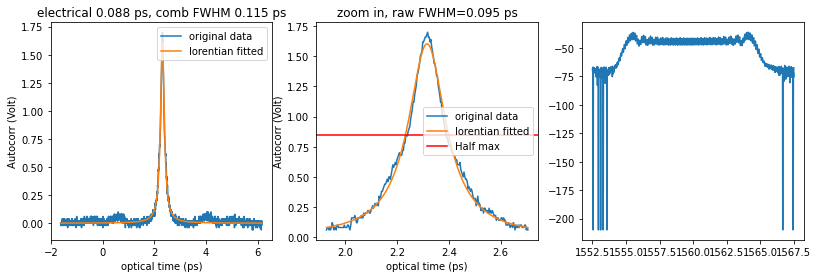

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.970_biaV_0.824_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

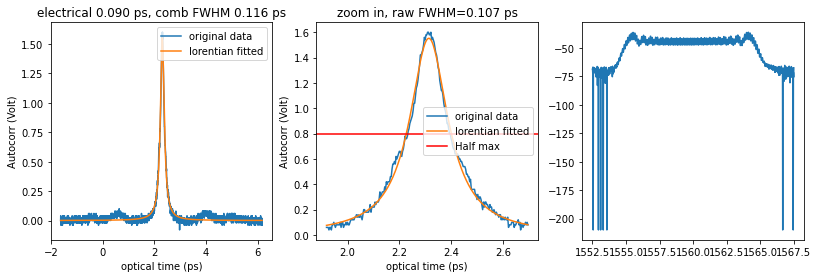

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.970_biaV_0.824_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

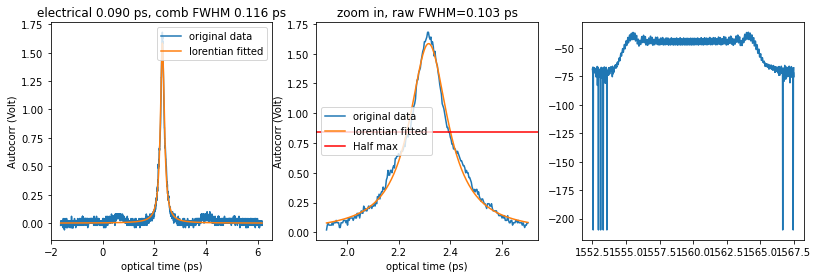

Waveshaper Set 3rd disper with d2=1.98 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.980_biaV_0.826_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

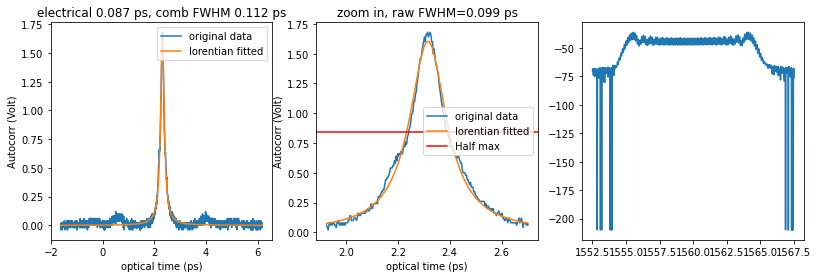

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.980_biaV_0.826_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

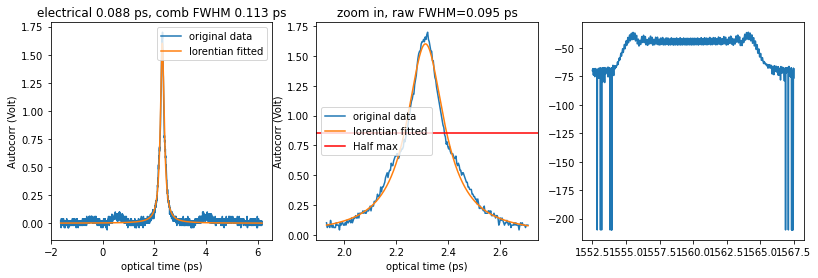

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.980_biaV_0.826_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

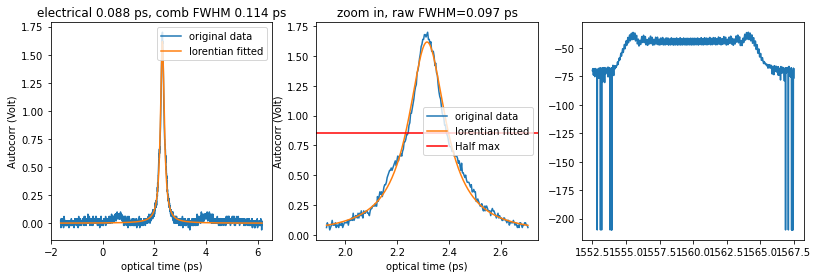

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.980_biaV_0.826_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

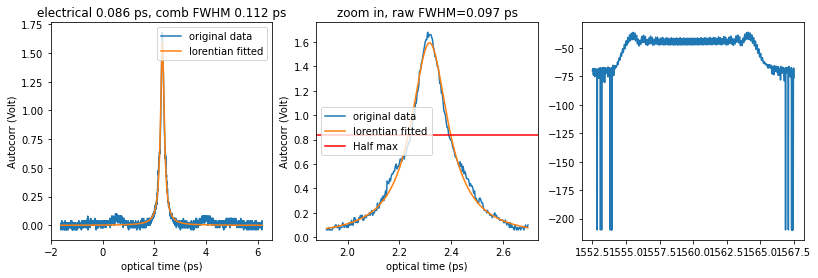

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.980_biaV_0.826_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

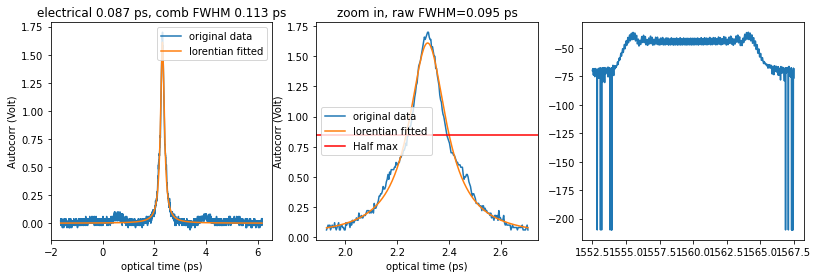

Waveshaper Set 3rd disper with d2=1.99 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.990_biaV_0.826_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

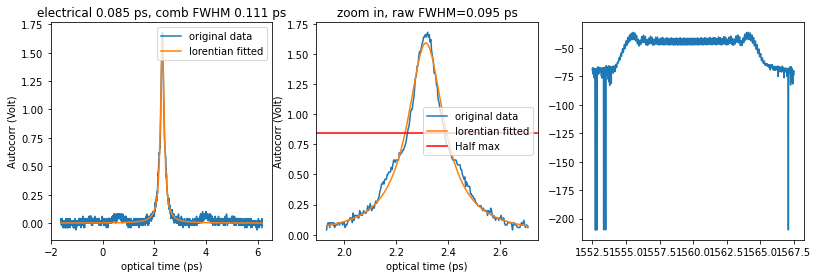

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.990_biaV_0.826_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

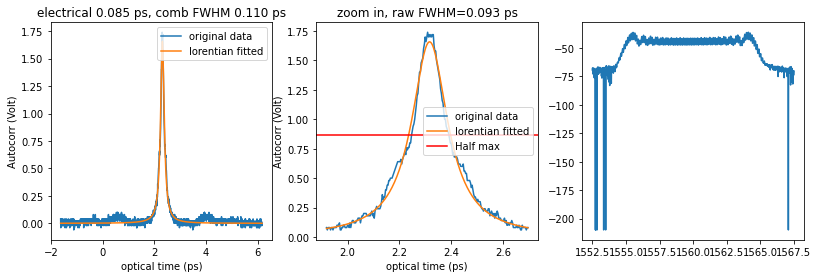

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.990_biaV_0.826_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

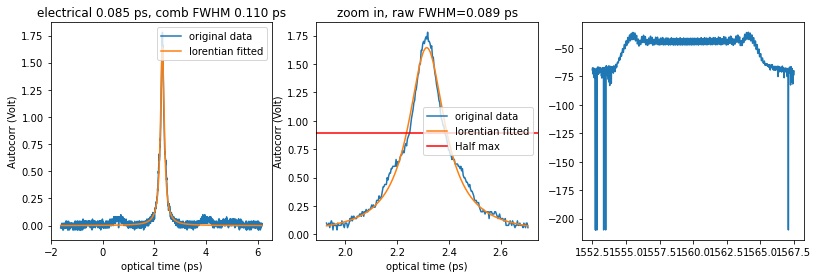

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.990_biaV_0.826_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

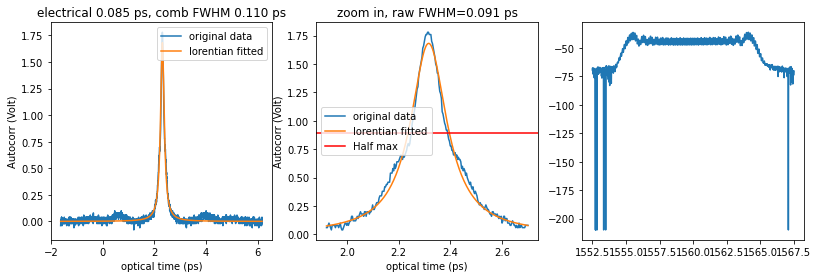

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_1.990_biaV_0.826_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

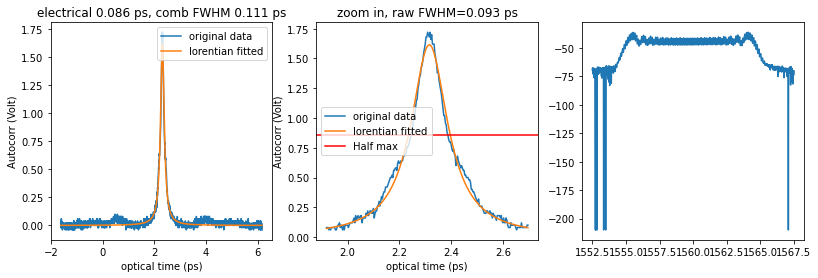

Waveshaper Set 3rd disper with d2=2.0 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.000_biaV_0.828_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

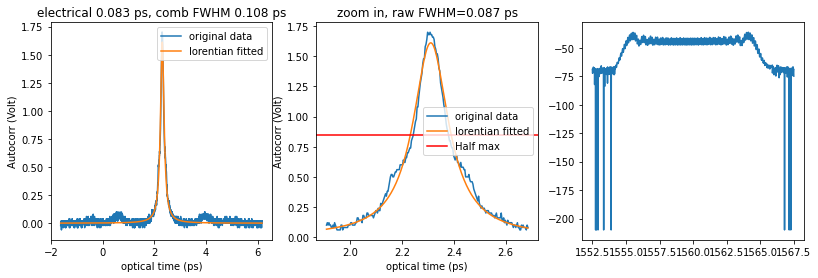

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.000_biaV_0.828_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

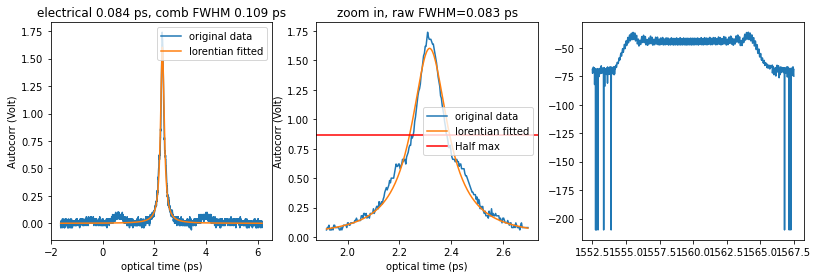

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.000_biaV_0.828_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

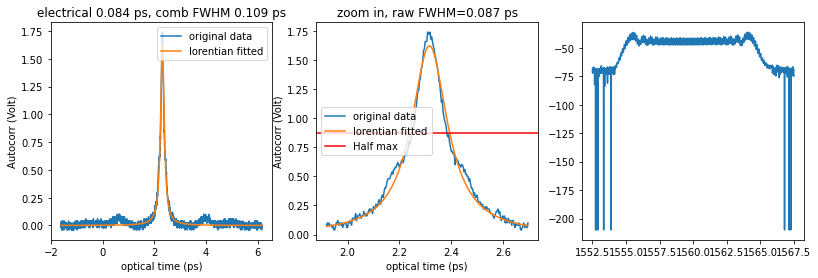

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.000_biaV_0.828_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

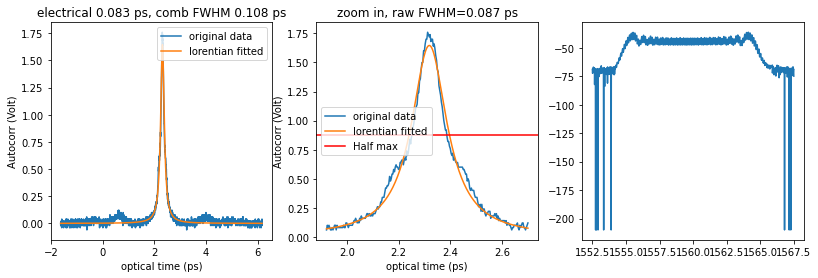

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.000_biaV_0.828_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

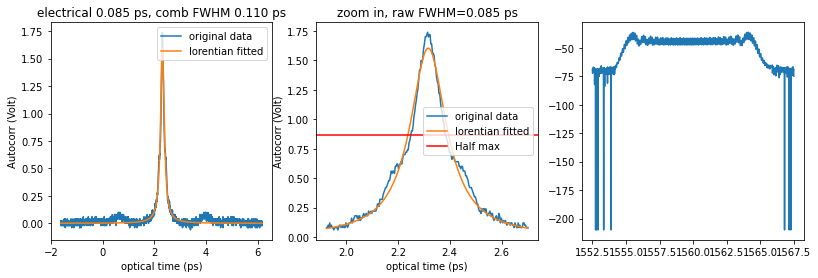

Waveshaper Set 3rd disper with d2=2.01 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.010_biaV_0.828_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

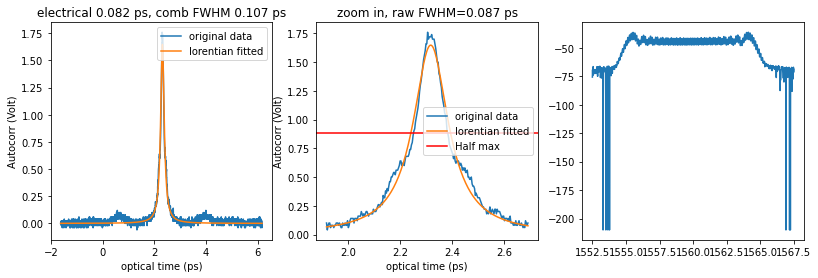

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.010_biaV_0.828_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

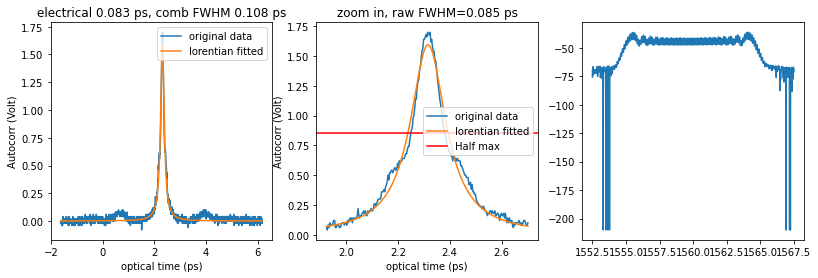

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.010_biaV_0.828_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

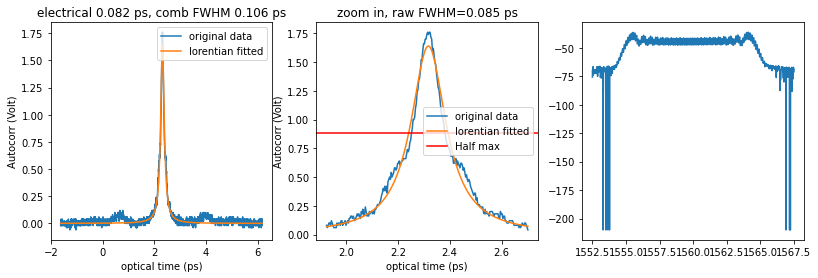

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.010_biaV_0.828_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

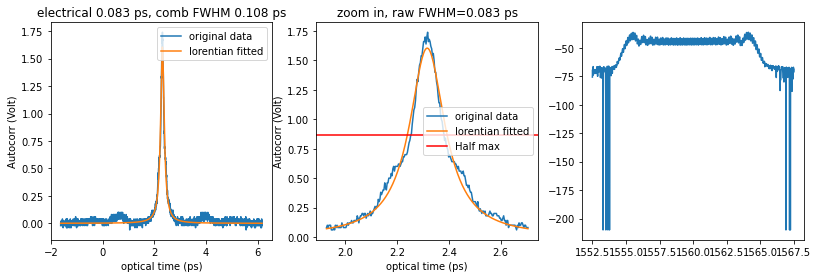

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.010_biaV_0.828_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

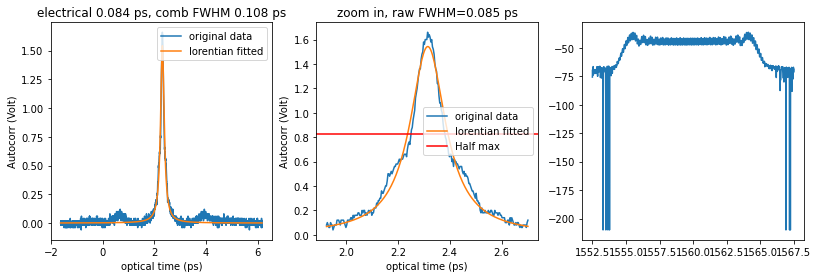

Waveshaper Set 3rd disper with d2=2.02 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.020_biaV_0.830_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

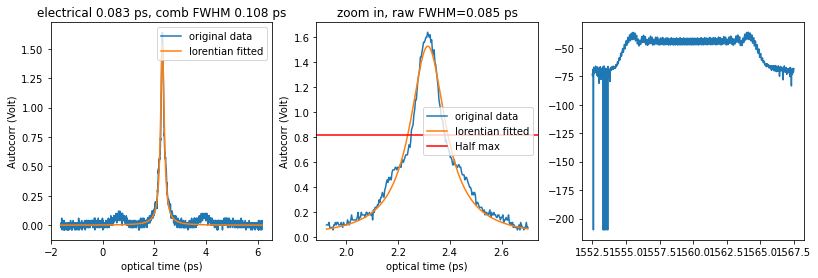

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.020_biaV_0.830_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

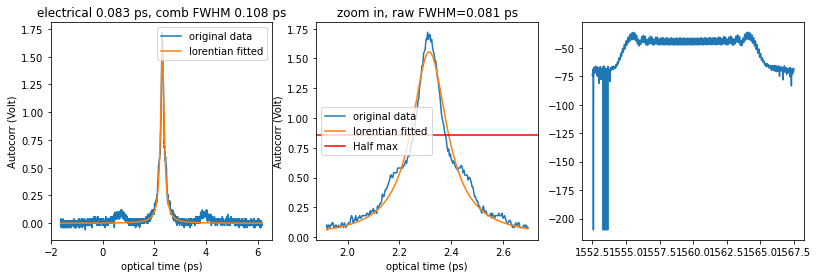

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.020_biaV_0.830_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

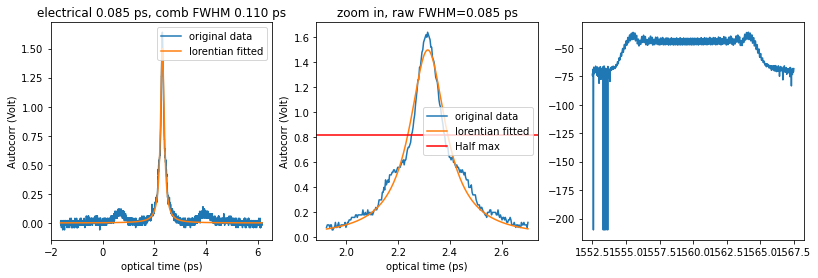

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.020_biaV_0.830_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

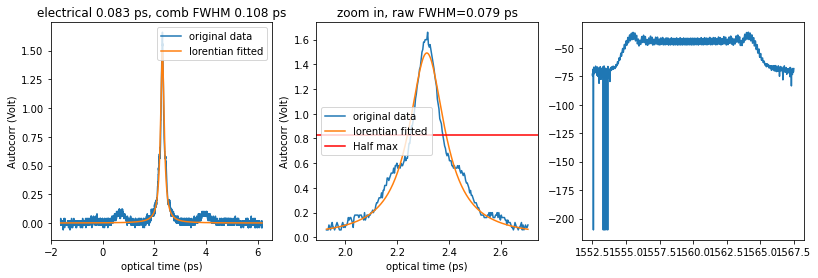

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.020_biaV_0.830_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

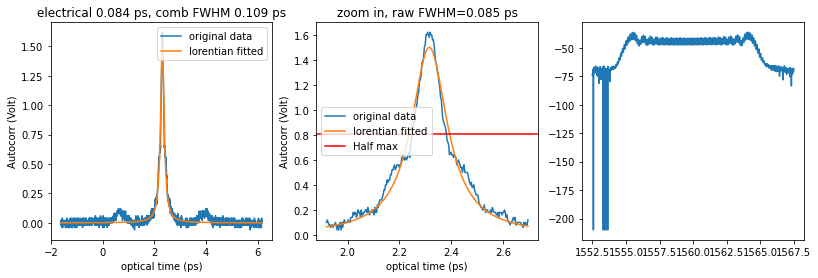

Waveshaper Set 3rd disper with d2=2.03 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.030_biaV_0.829_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

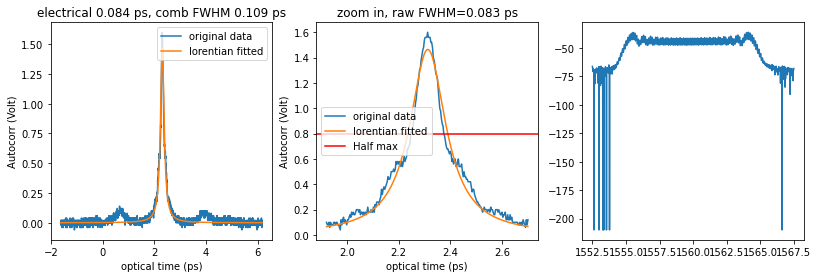

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.030_biaV_0.829_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

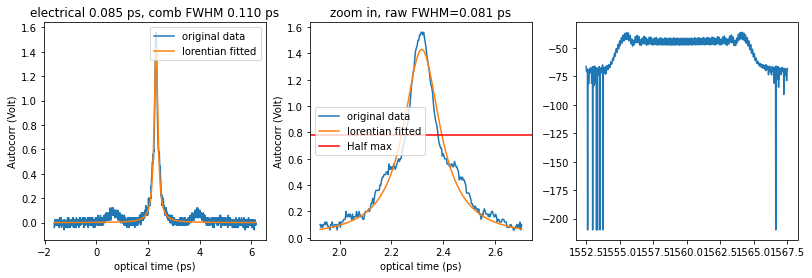

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.030_biaV_0.829_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

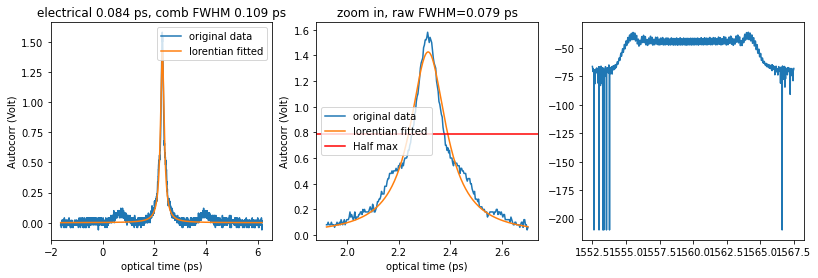

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.030_biaV_0.829_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

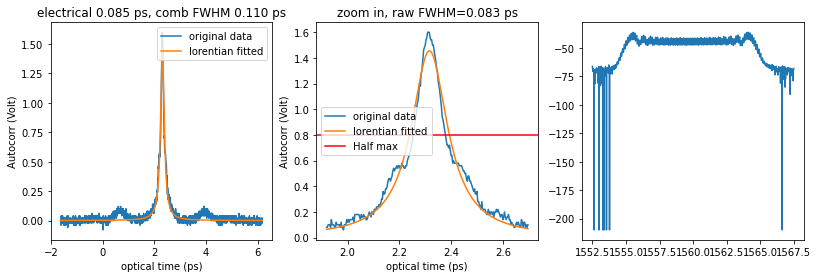

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.030_biaV_0.829_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

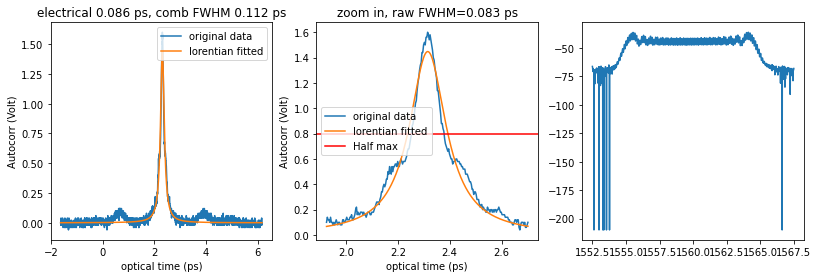

Waveshaper Set 3rd disper with d2=2.04 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.040_biaV_0.829_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

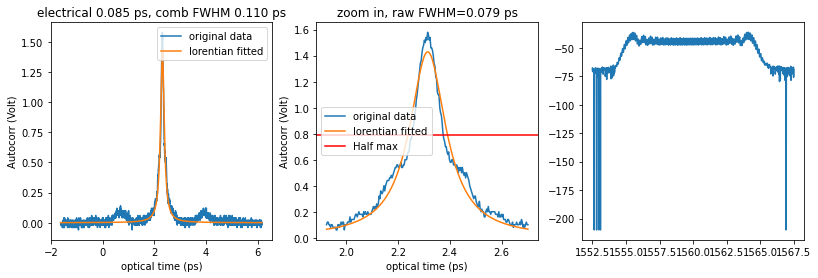

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.040_biaV_0.829_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

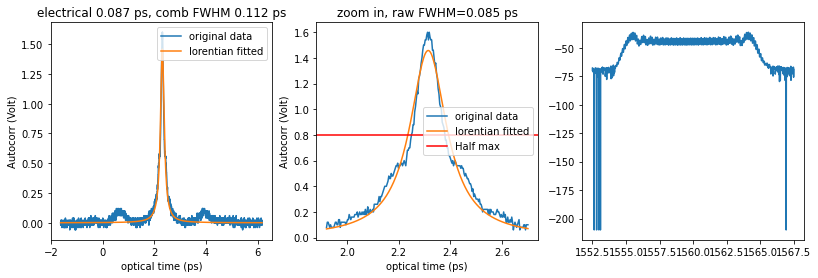

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.040_biaV_0.829_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

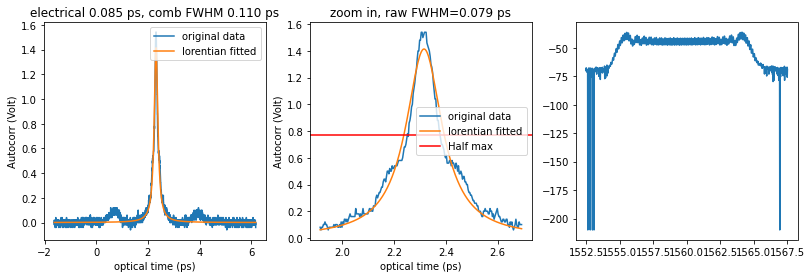

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.040_biaV_0.829_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

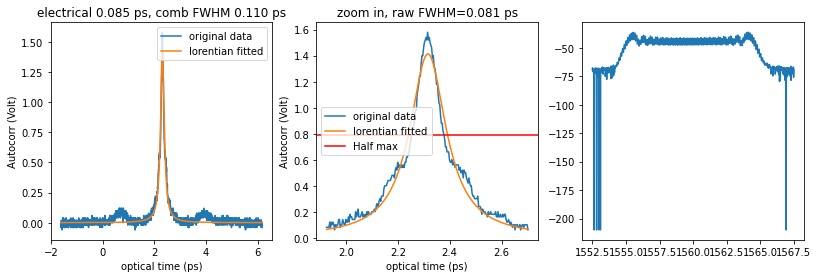

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.040_biaV_0.829_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

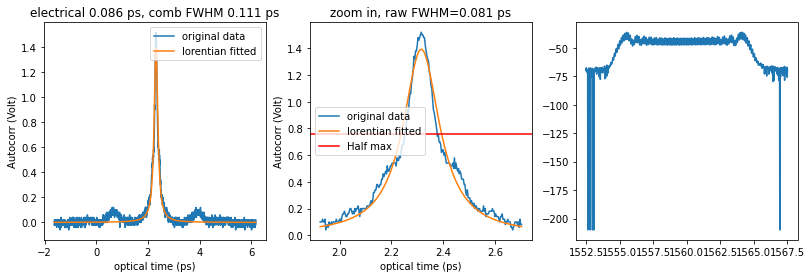

Waveshaper Set 3rd disper with d2=2.05 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.050_biaV_0.828_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

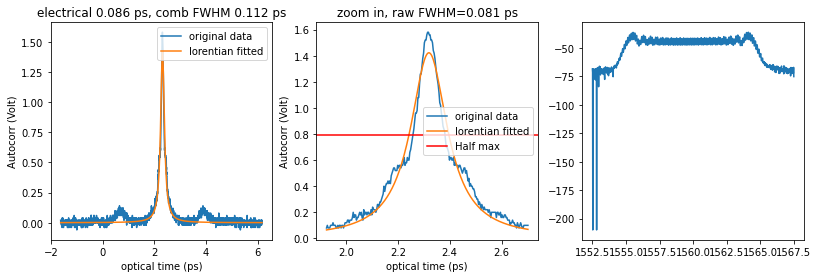

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.050_biaV_0.828_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

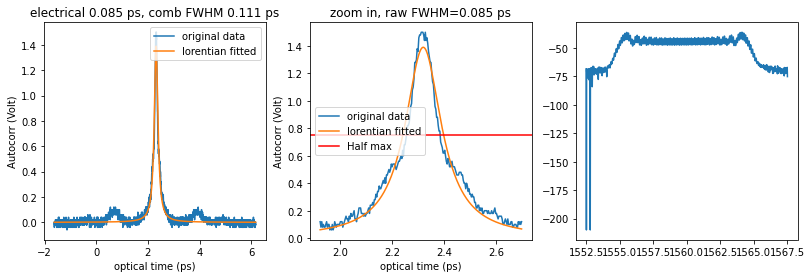

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.050_biaV_0.828_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

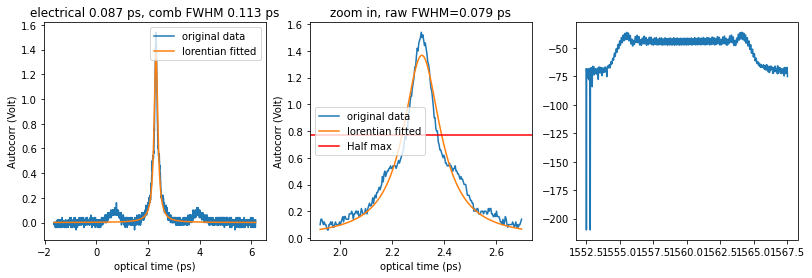

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.050_biaV_0.828_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

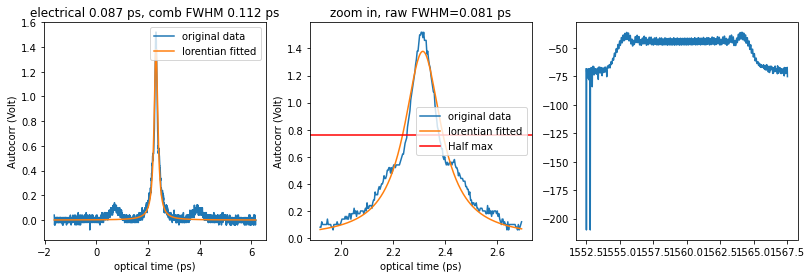

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.050_biaV_0.828_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

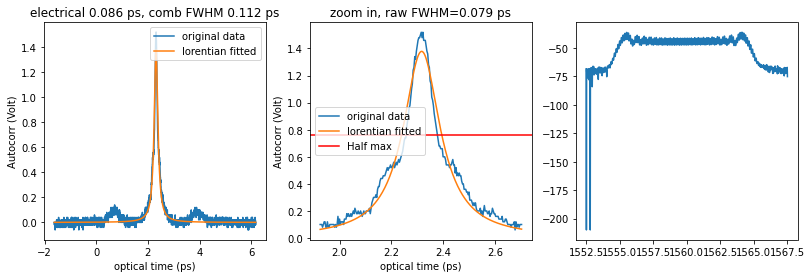

Waveshaper Set 3rd disper with d2=2.06 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.060_biaV_0.827_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

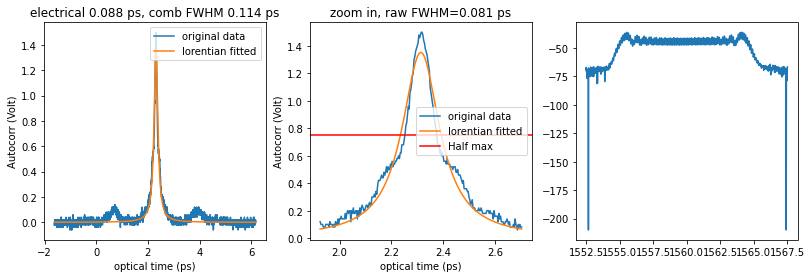

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.060_biaV_0.827_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

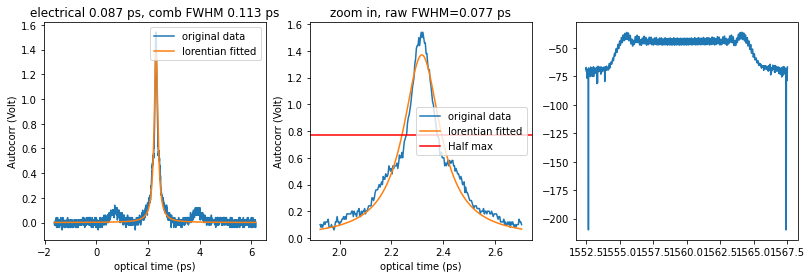

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.060_biaV_0.827_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

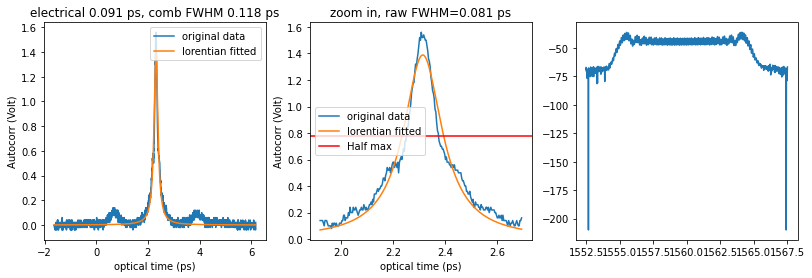

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.060_biaV_0.827_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

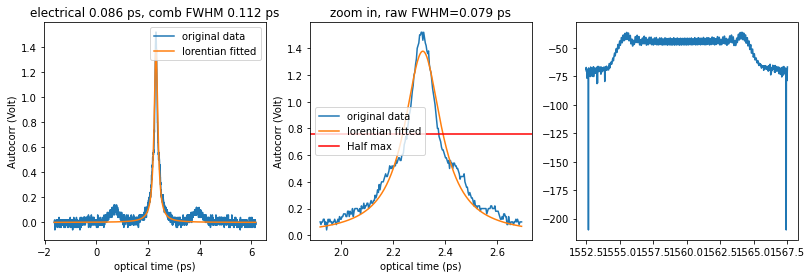

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.060_biaV_0.827_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

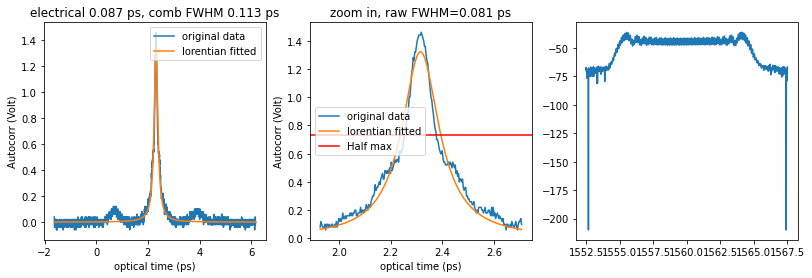

Waveshaper Set 3rd disper with d2=2.07 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.070_biaV_0.828_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

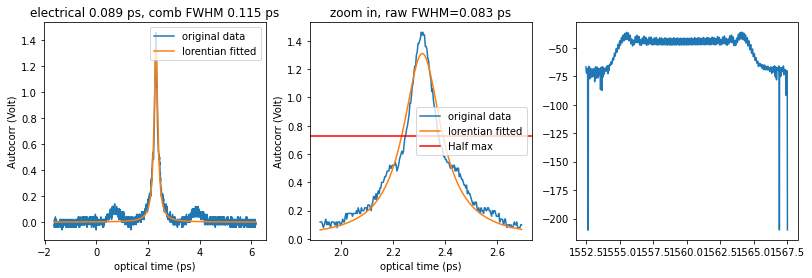

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.070_biaV_0.828_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

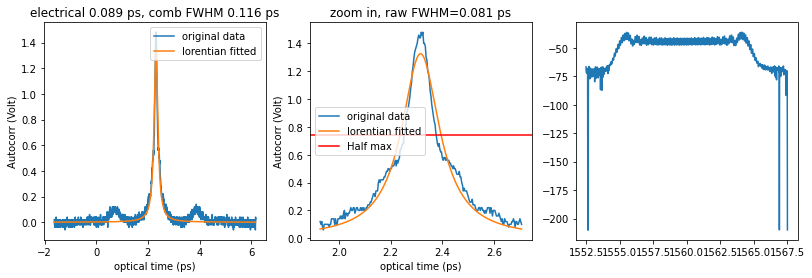

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.070_biaV_0.828_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

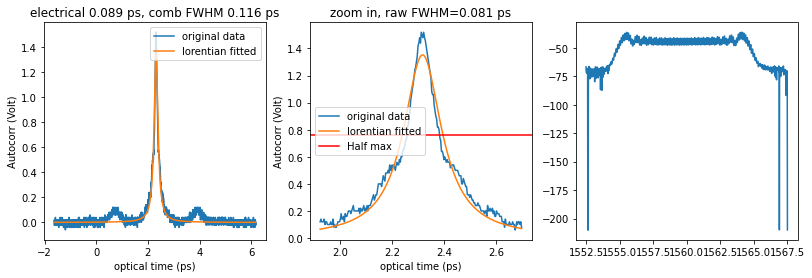

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.070_biaV_0.828_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

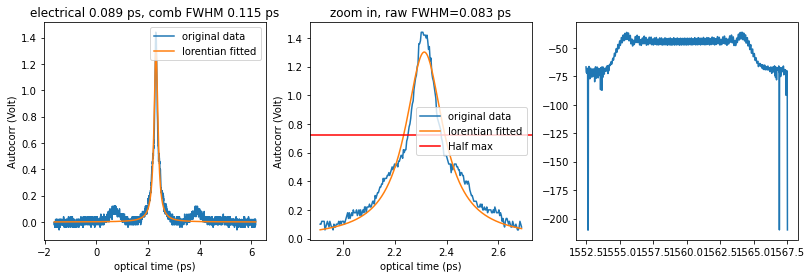

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.070_biaV_0.828_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

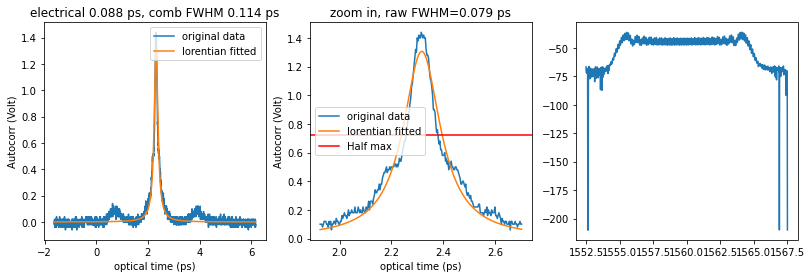

Waveshaper Set 3rd disper with d2=2.08 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.080_biaV_0.828_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

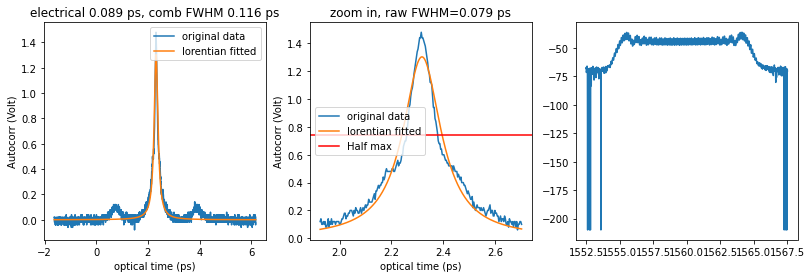

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.080_biaV_0.828_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

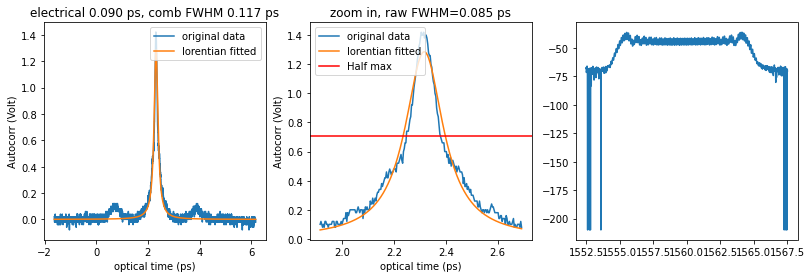

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.080_biaV_0.828_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

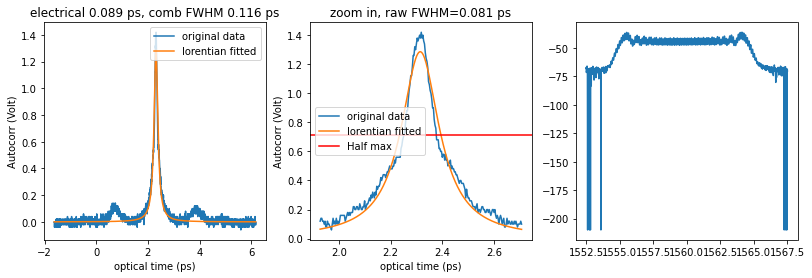

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.080_biaV_0.828_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

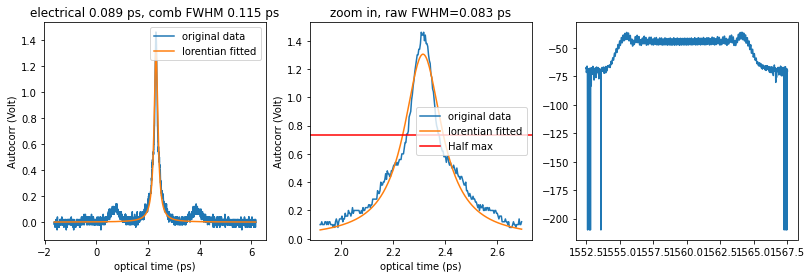

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.080_biaV_0.828_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

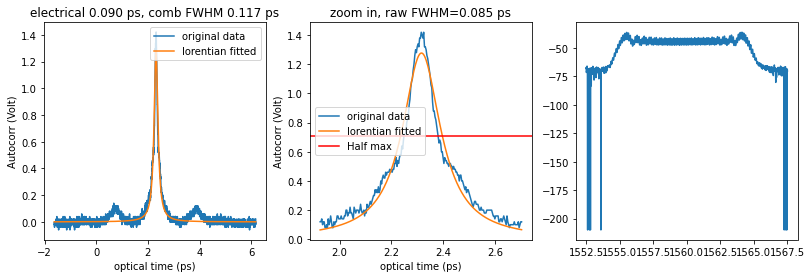

Waveshaper Set 3rd disper with d2=2.09 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.090_biaV_0.826_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

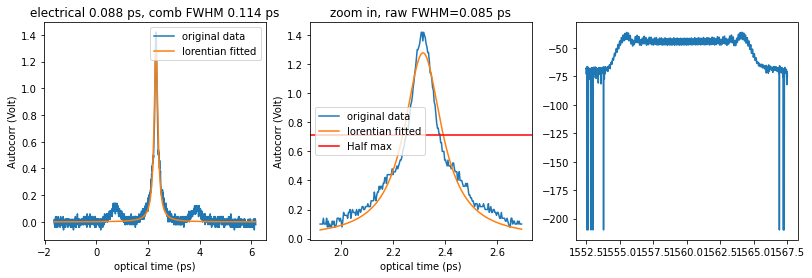

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.090_biaV_0.826_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

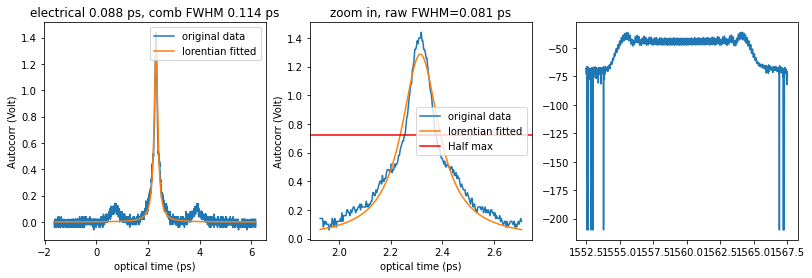

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.090_biaV_0.826_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

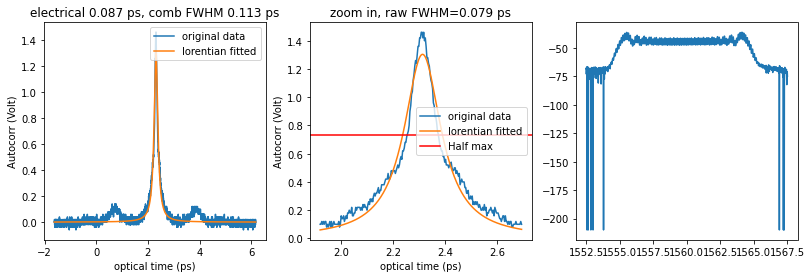

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.090_biaV_0.826_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

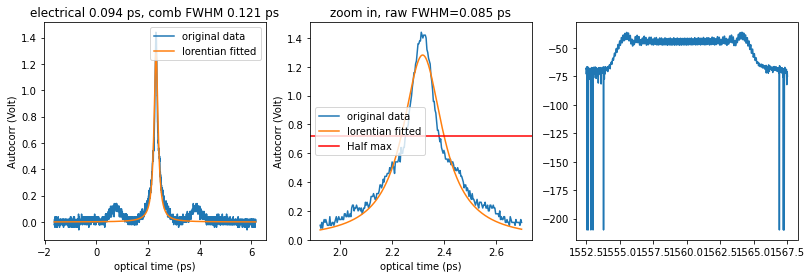

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.090_biaV_0.826_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

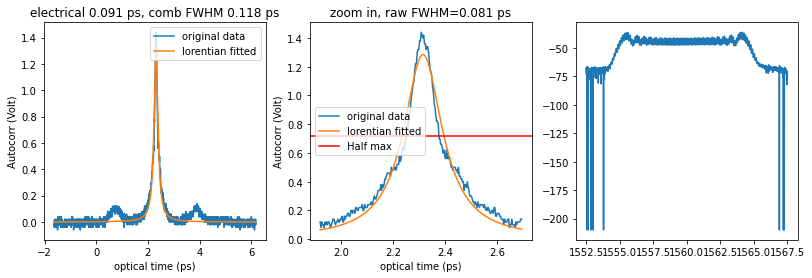

Waveshaper Set 3rd disper with d2=2.1 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.100_biaV_0.825_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

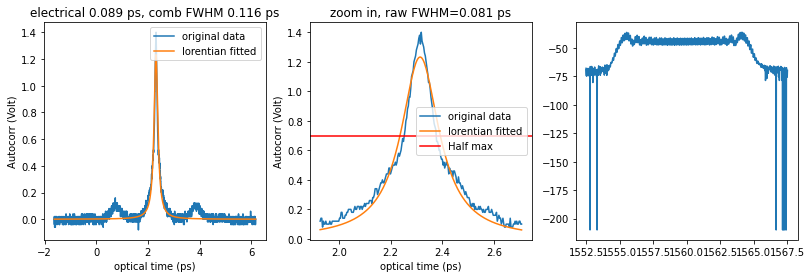

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.100_biaV_0.825_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

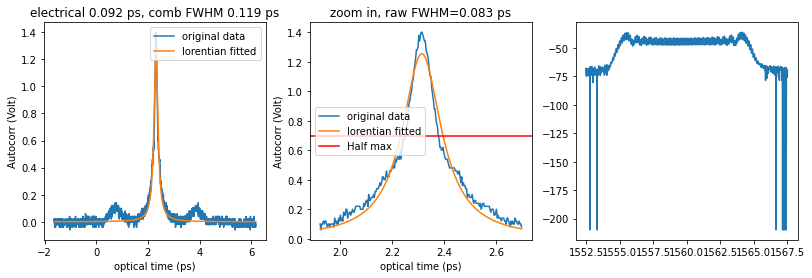

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.100_biaV_0.825_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

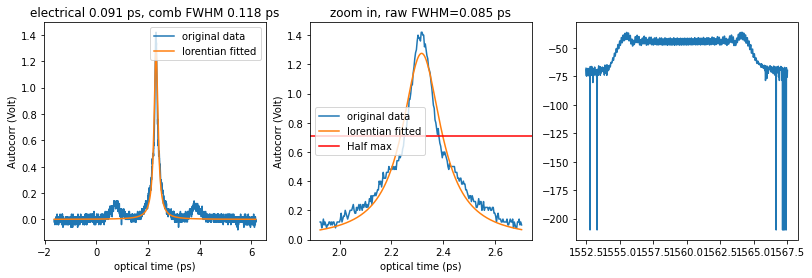

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.100_biaV_0.825_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

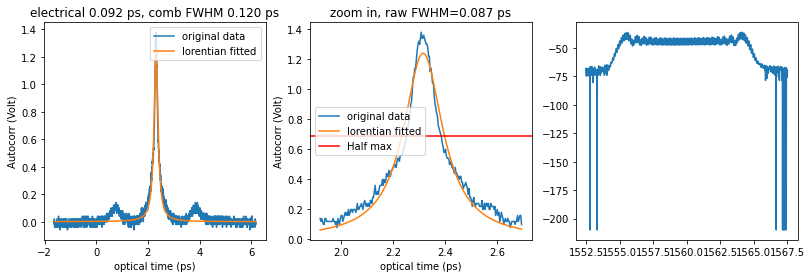

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.100_biaV_0.825_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

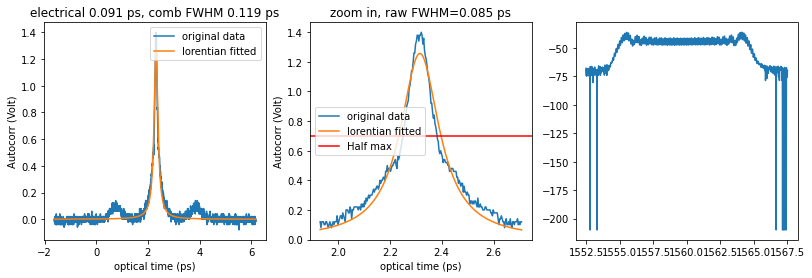

Waveshaper Set 3rd disper with d2=2.11 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.110_biaV_0.826_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

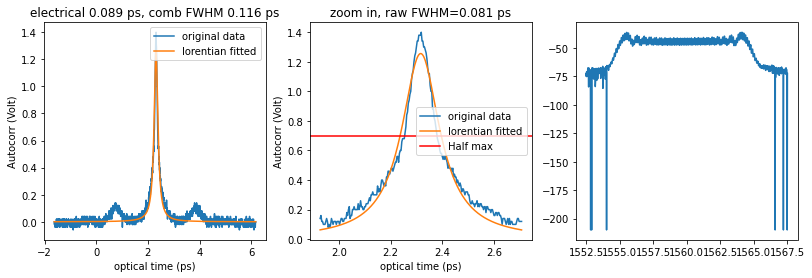

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.110_biaV_0.826_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

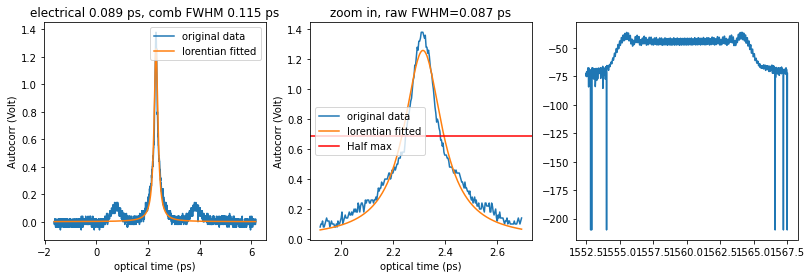

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.110_biaV_0.826_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

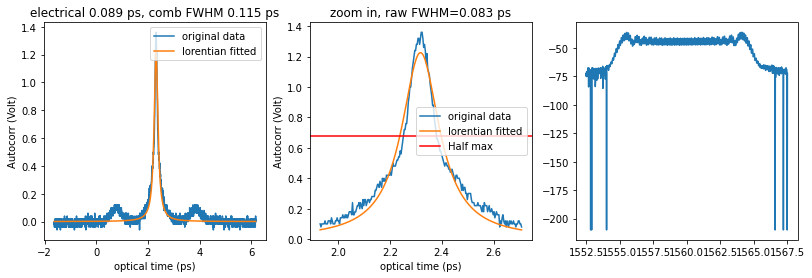

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.110_biaV_0.826_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

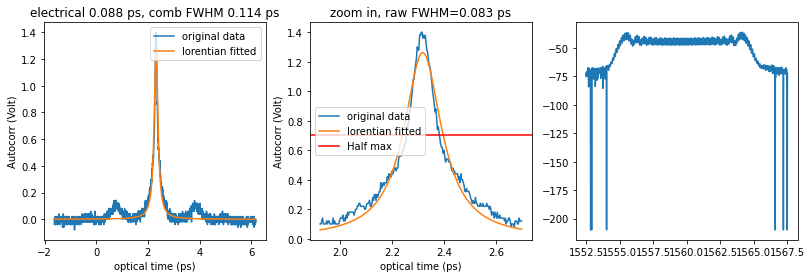

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.110_biaV_0.826_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

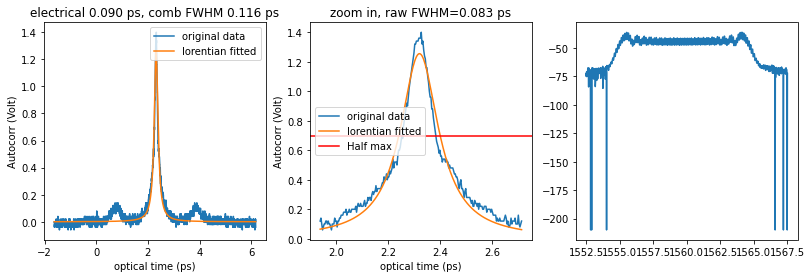

Waveshaper Set 3rd disper with d2=2.12 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.120_biaV_0.826_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

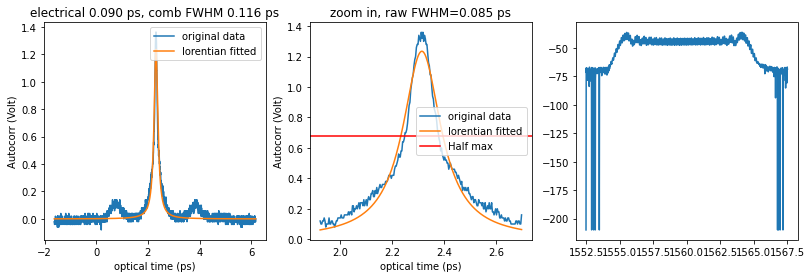

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.120_biaV_0.826_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

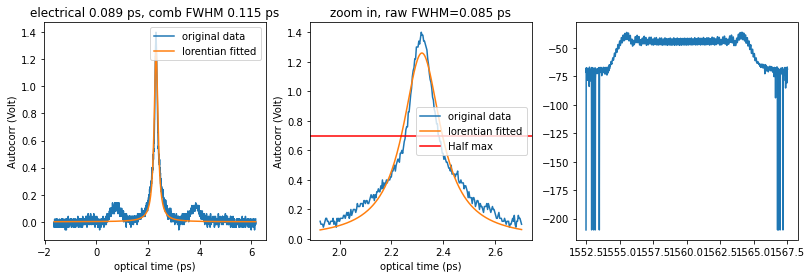

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.120_biaV_0.826_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

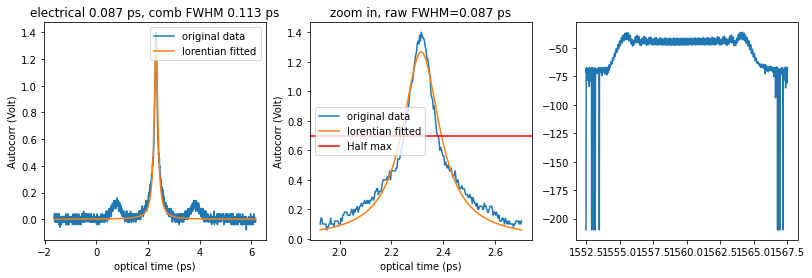

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.120_biaV_0.826_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

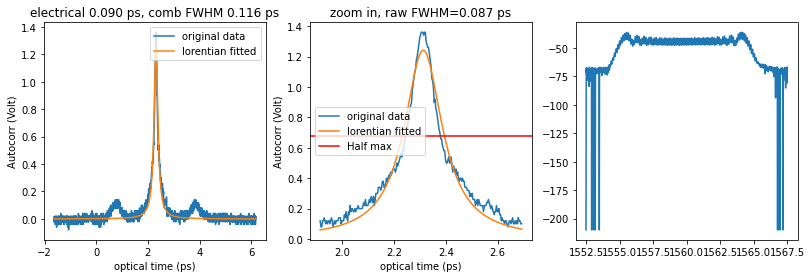

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.120_biaV_0.826_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

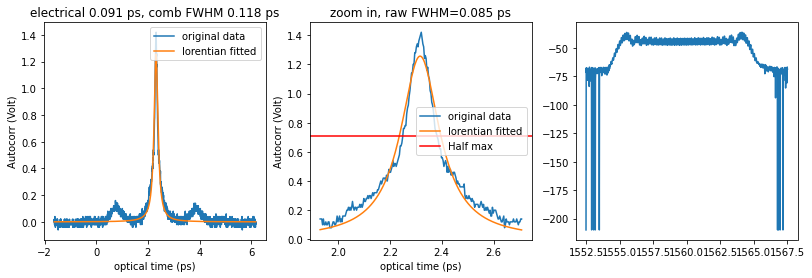

Waveshaper Set 3rd disper with d2=2.13 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.130_biaV_0.824_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

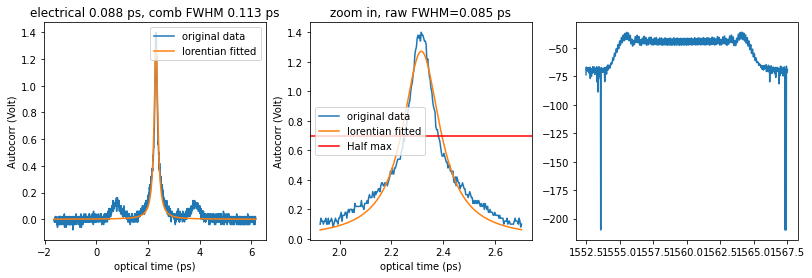

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.130_biaV_0.824_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

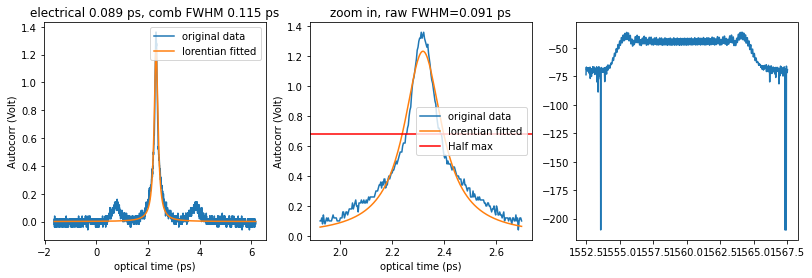

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.130_biaV_0.824_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

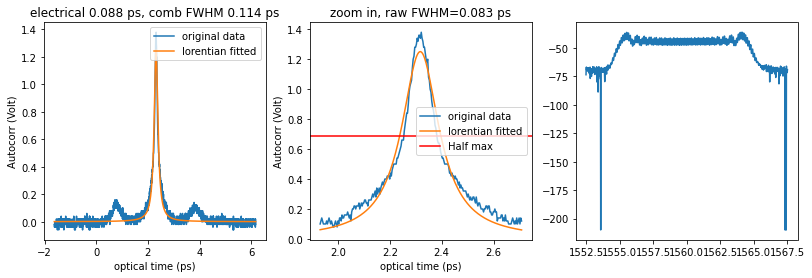

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.130_biaV_0.824_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

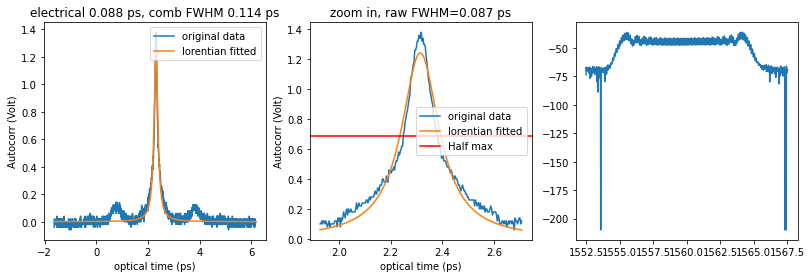

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.130_biaV_0.824_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

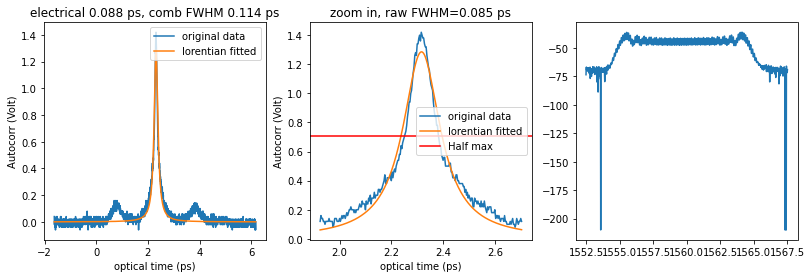

Waveshaper Set 3rd disper with d2=2.14 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.140_biaV_0.823_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

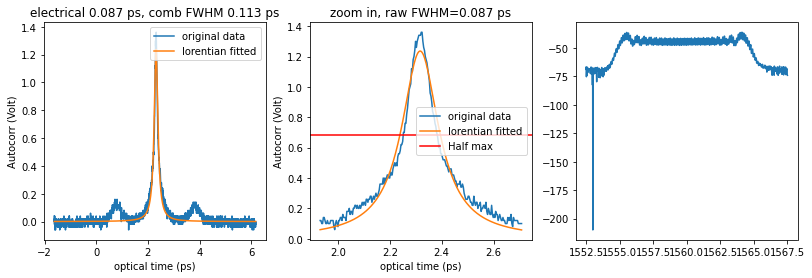

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.140_biaV_0.823_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

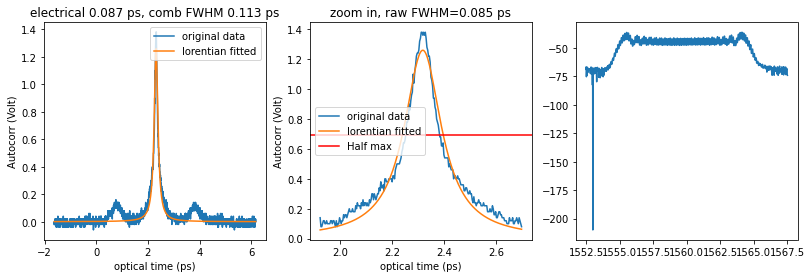

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.140_biaV_0.823_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

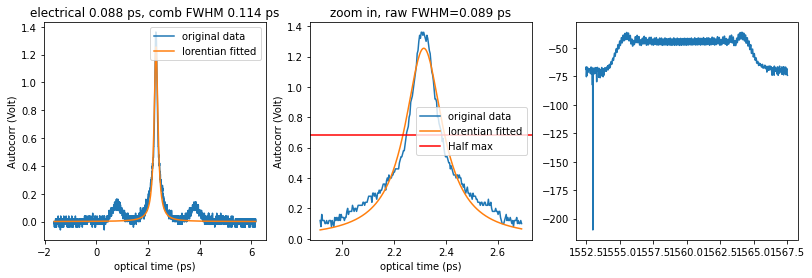

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.140_biaV_0.823_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

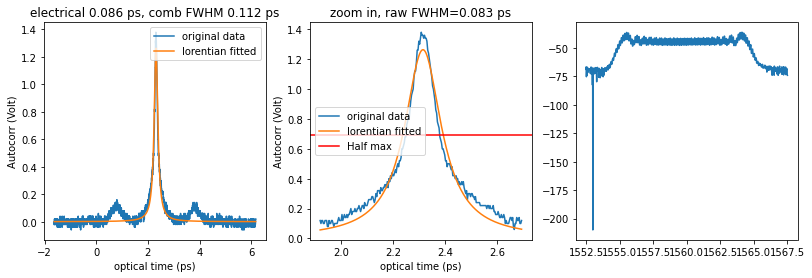

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.140_biaV_0.823_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

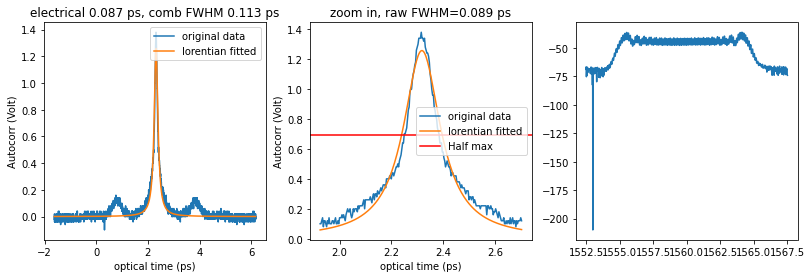

Waveshaper Set 3rd disper with d2=2.15 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.150_biaV_0.822_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

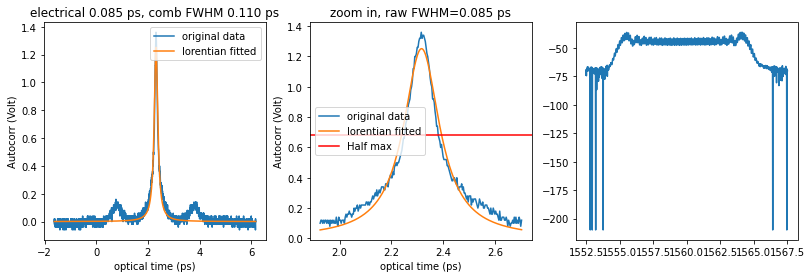

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.150_biaV_0.822_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

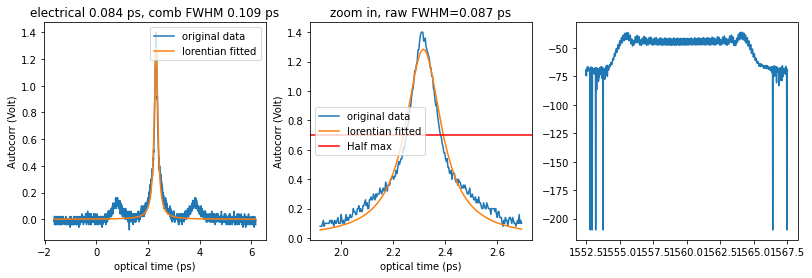

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.150_biaV_0.822_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

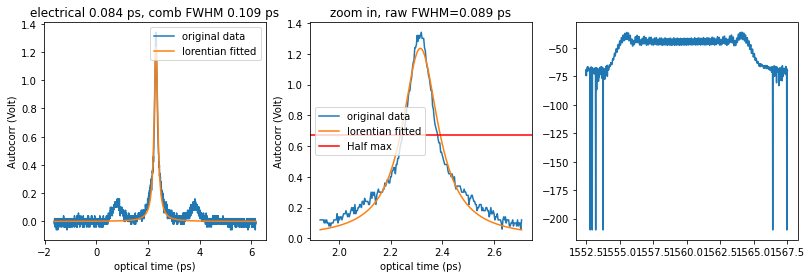

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.150_biaV_0.822_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

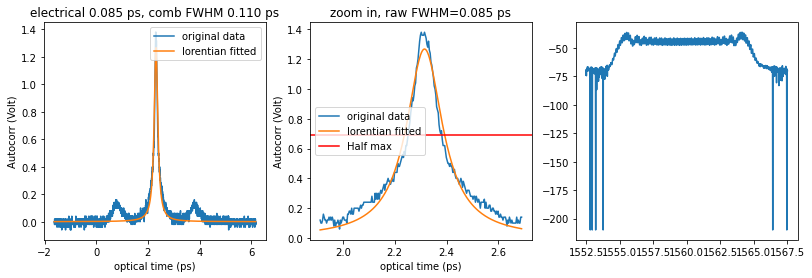

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.150_biaV_0.822_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

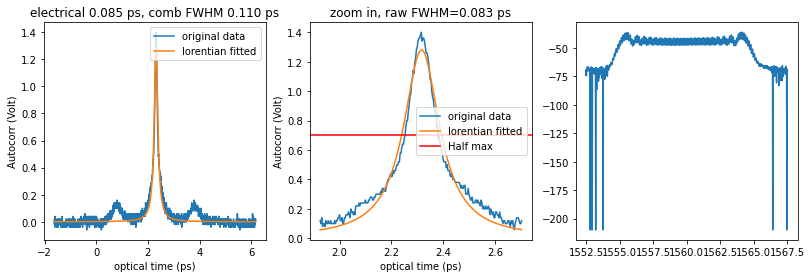

Waveshaper Set 3rd disper with d2=2.16 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.160_biaV_0.822_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

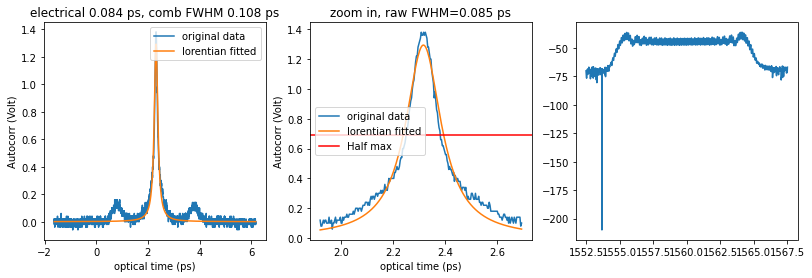

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.160_biaV_0.822_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

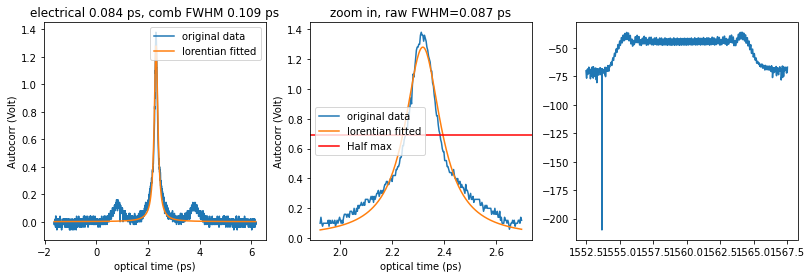

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.160_biaV_0.822_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

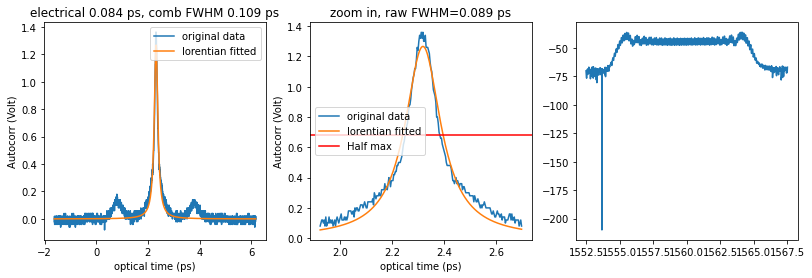

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.160_biaV_0.822_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

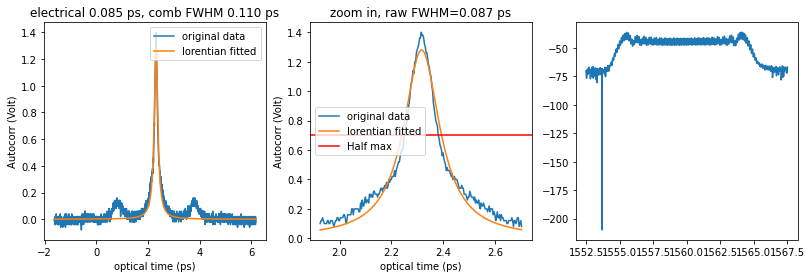

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.160_biaV_0.822_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

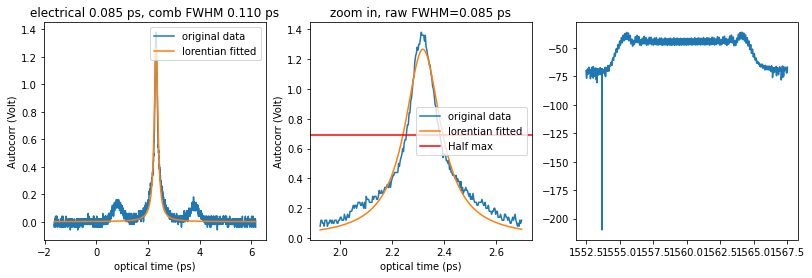

Waveshaper Set 3rd disper with d2=2.17 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.170_biaV_0.822_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

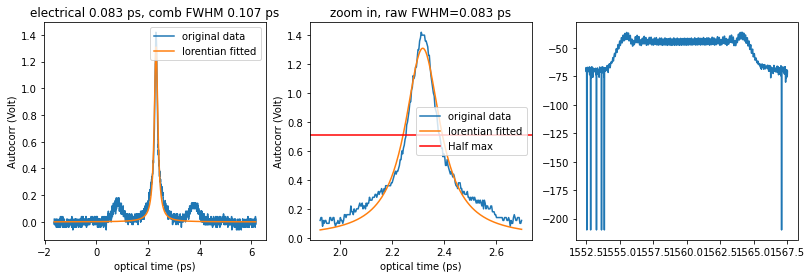

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.170_biaV_0.822_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

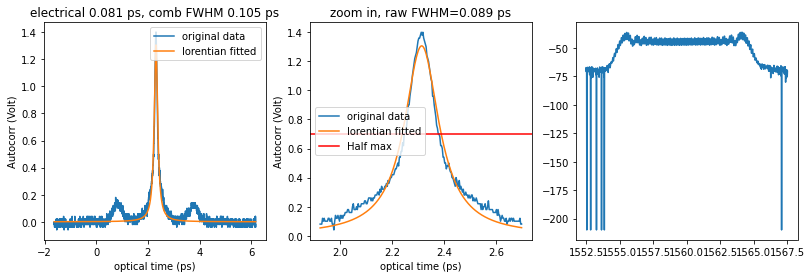

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.170_biaV_0.822_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

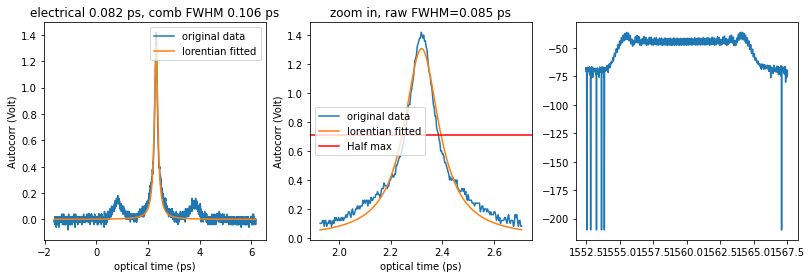

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.170_biaV_0.822_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

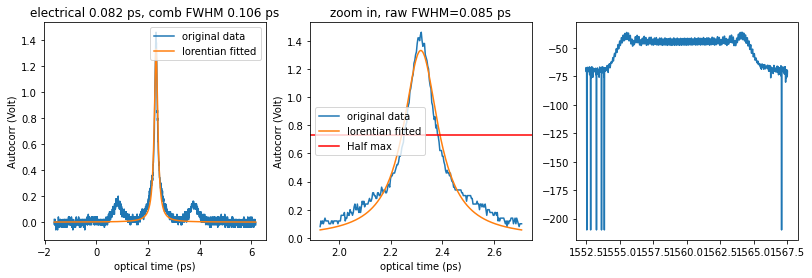

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.170_biaV_0.822_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

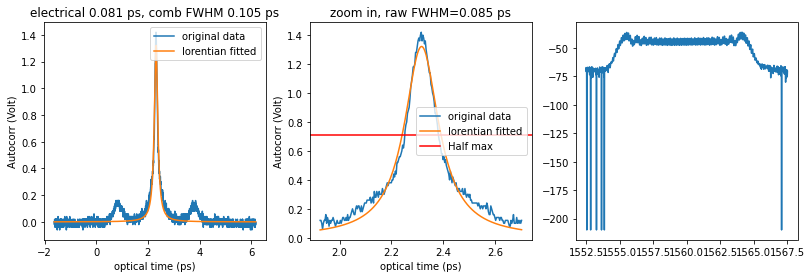

Waveshaper Set 3rd disper with d2=2.18 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.180_biaV_0.820_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

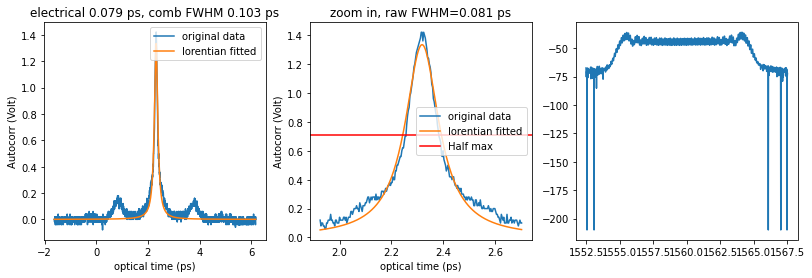

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.180_biaV_0.820_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

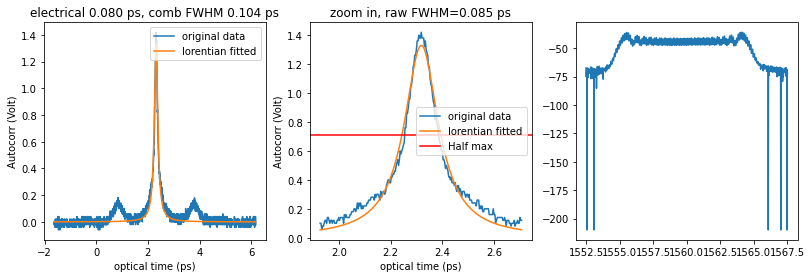

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.180_biaV_0.820_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

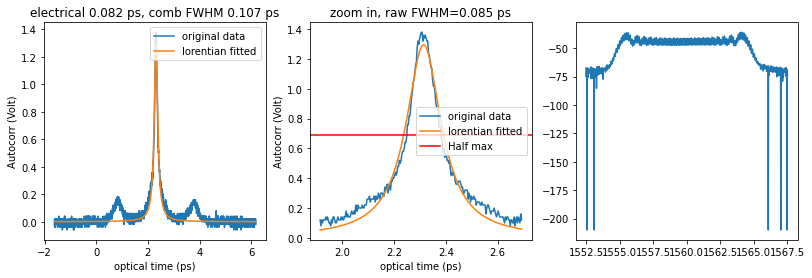

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.180_biaV_0.820_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

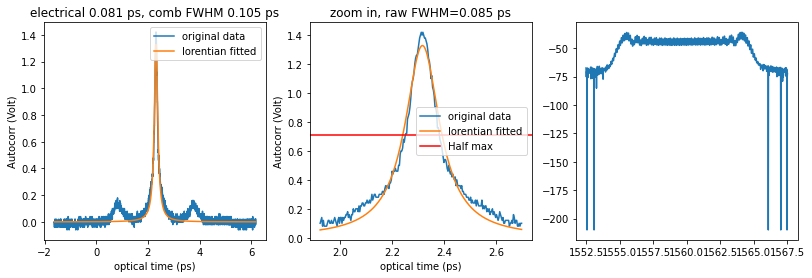

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.180_biaV_0.820_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

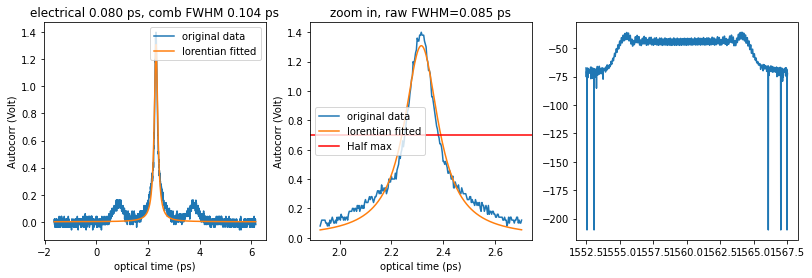

Waveshaper Set 3rd disper with d2=2.19 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.190_biaV_0.820_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

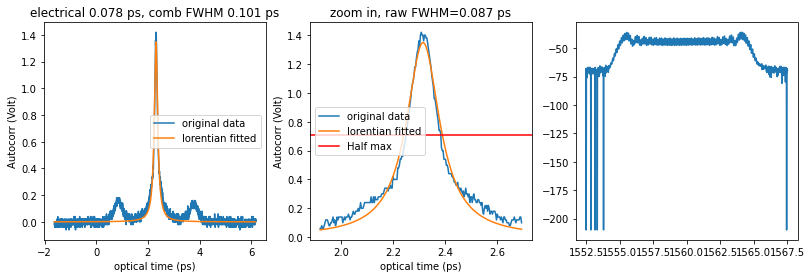

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.190_biaV_0.820_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

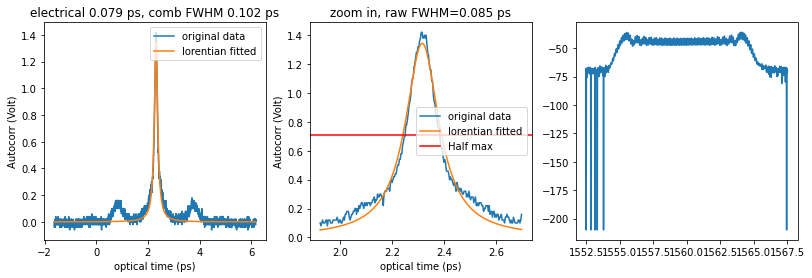

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.190_biaV_0.820_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

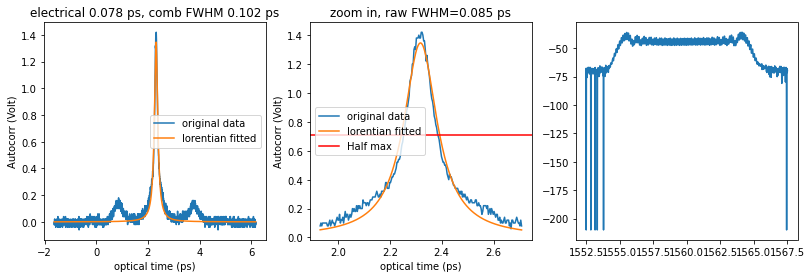

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.190_biaV_0.820_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

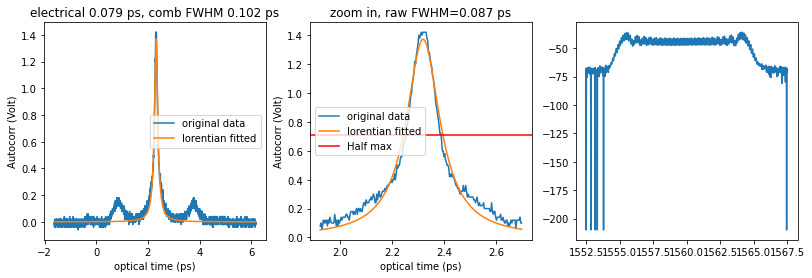

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.190_biaV_0.820_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

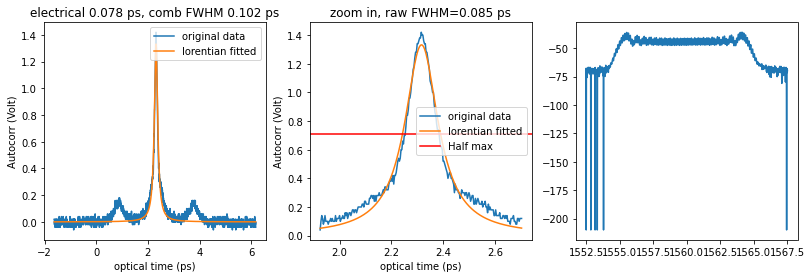

Waveshaper Set 3rd disper with d2=2.2 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.200_biaV_0.819_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

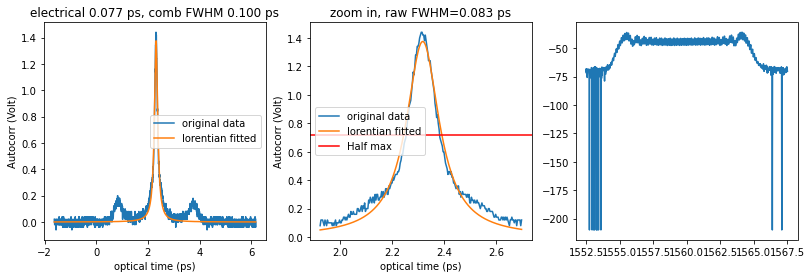

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.200_biaV_0.819_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

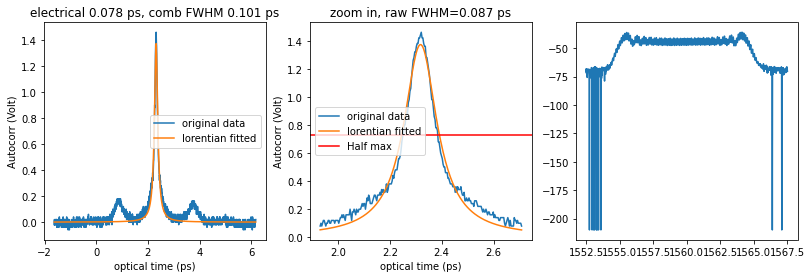

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.200_biaV_0.819_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

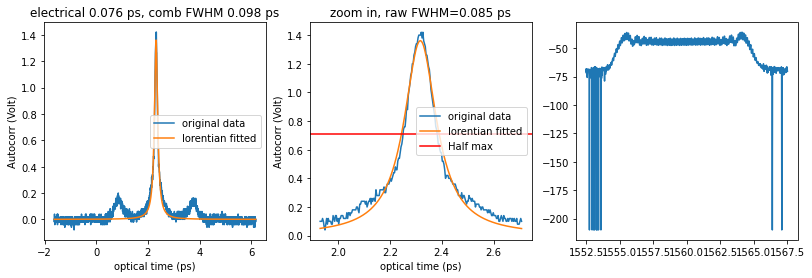

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.200_biaV_0.819_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

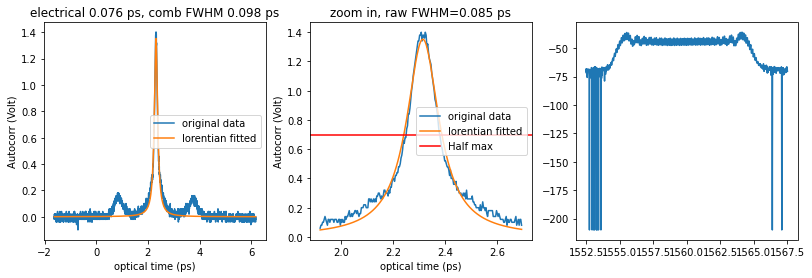

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.200_biaV_0.819_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

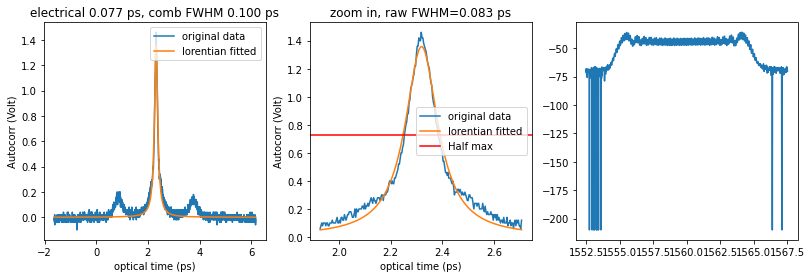

Waveshaper Set 3rd disper with d2=2.21 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.210_biaV_0.815_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

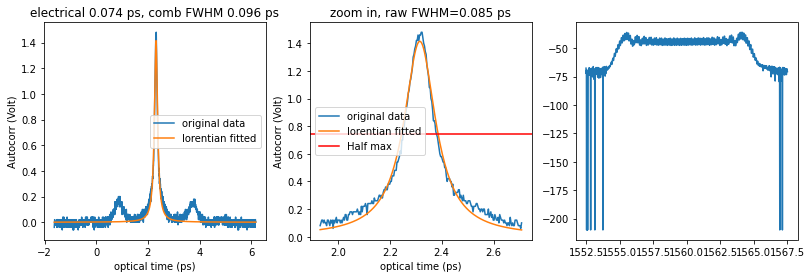

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.210_biaV_0.815_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

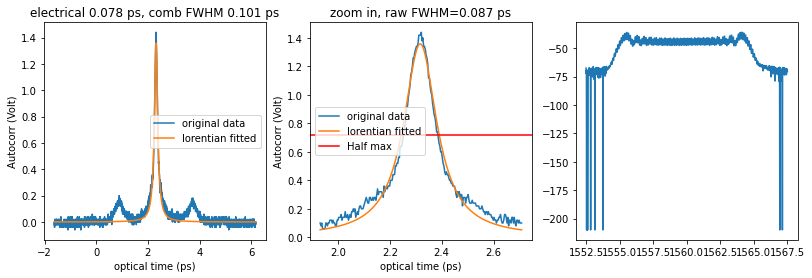

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.210_biaV_0.815_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

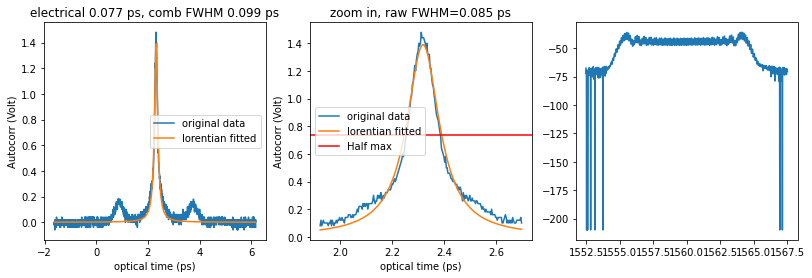

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.210_biaV_0.815_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

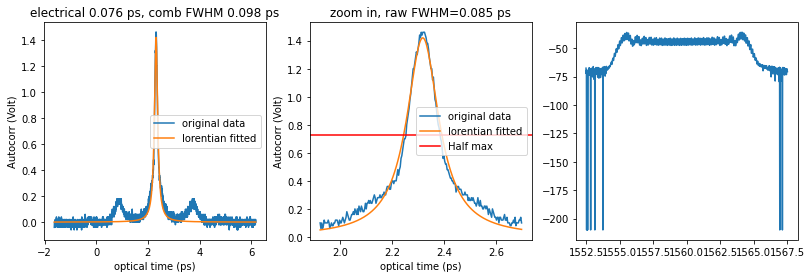

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.210_biaV_0.815_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

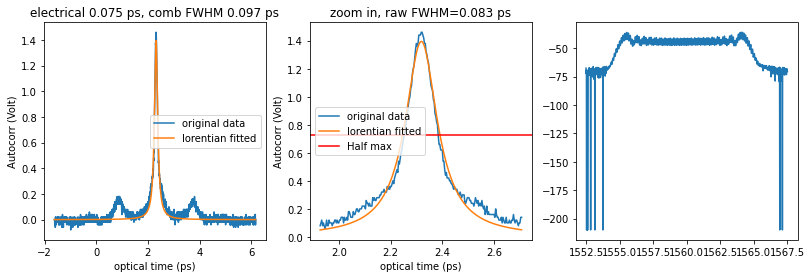

Waveshaper Set 3rd disper with d2=2.22 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.220_biaV_0.816_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

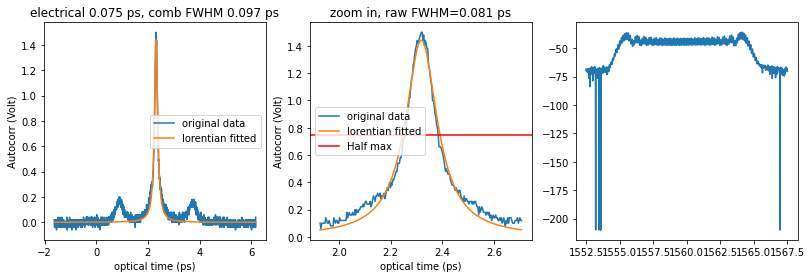

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.220_biaV_0.816_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

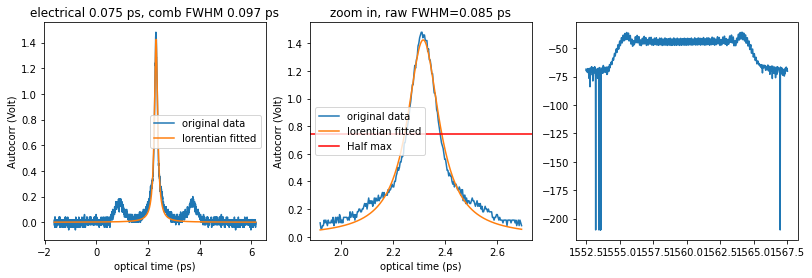

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.220_biaV_0.816_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

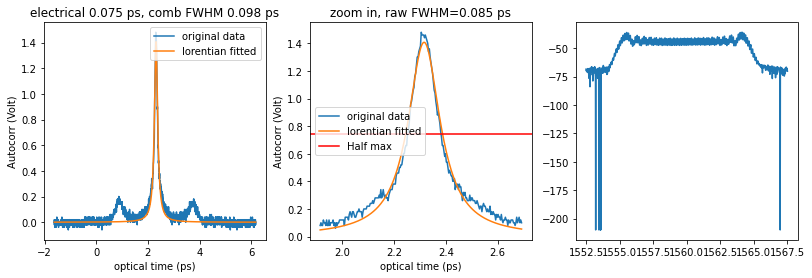

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.220_biaV_0.816_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

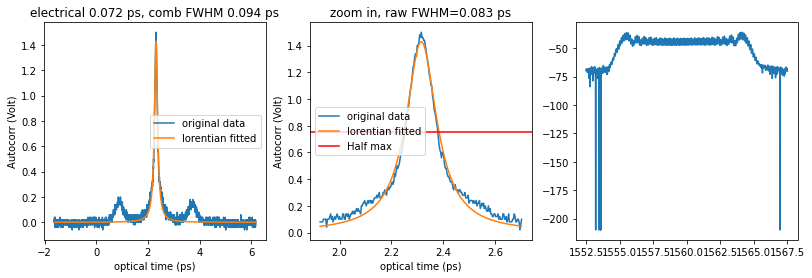

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.220_biaV_0.816_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

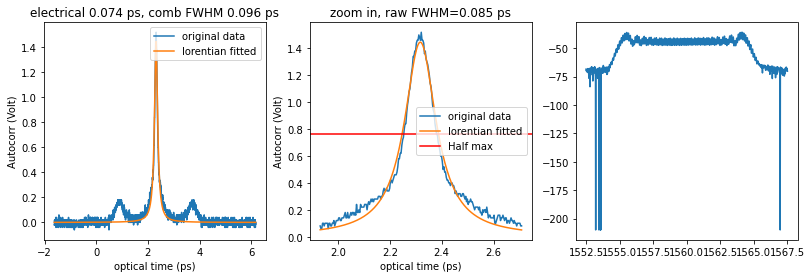

Waveshaper Set 3rd disper with d2=2.23 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.230_biaV_0.817_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

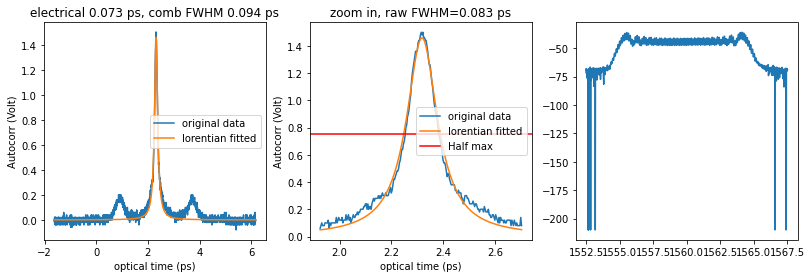

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.230_biaV_0.817_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

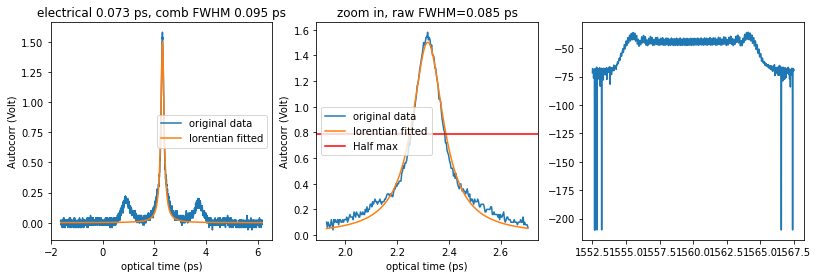

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.230_biaV_0.817_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

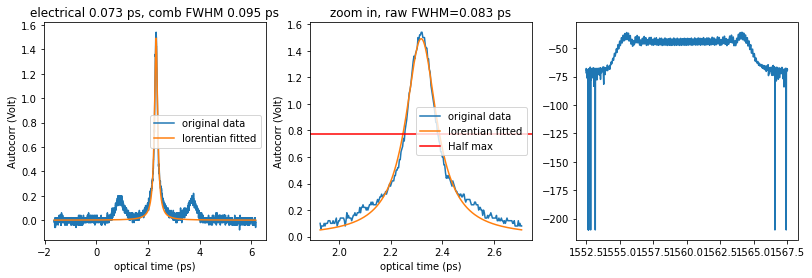

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.230_biaV_0.817_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

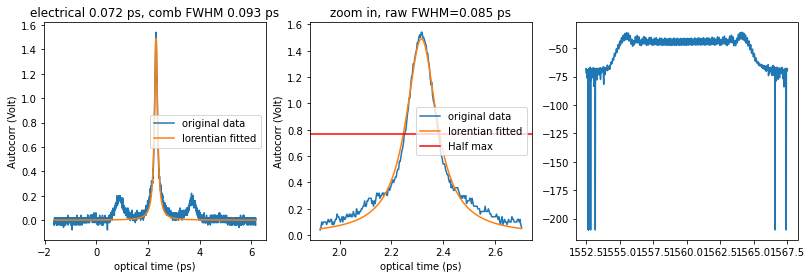

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.230_biaV_0.817_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

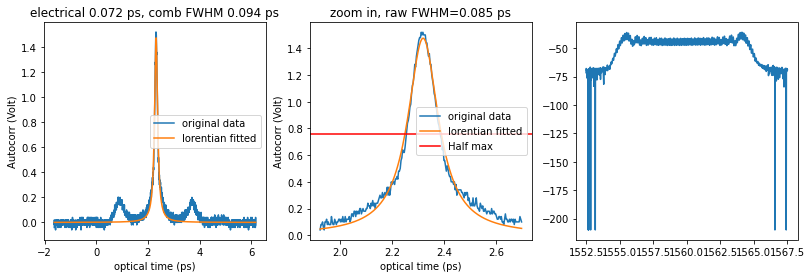

Waveshaper Set 3rd disper with d2=2.24 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.240_biaV_0.818_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

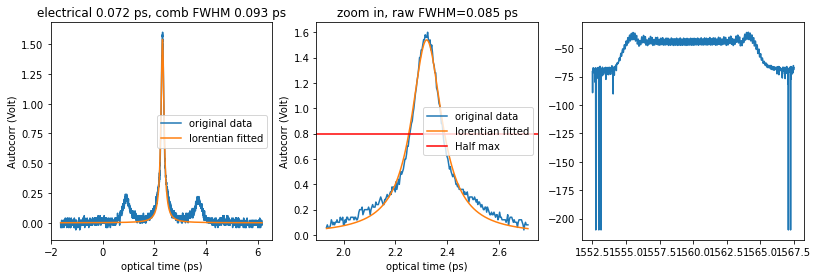

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.240_biaV_0.818_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

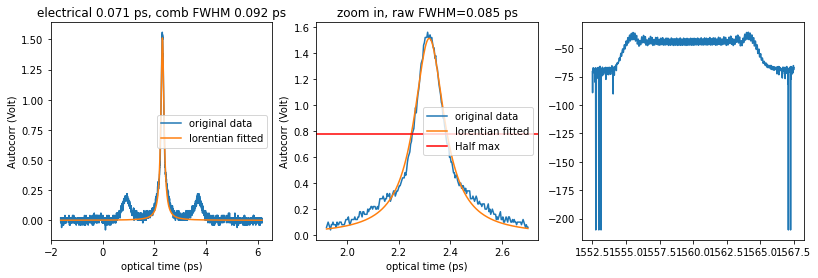

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.240_biaV_0.818_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

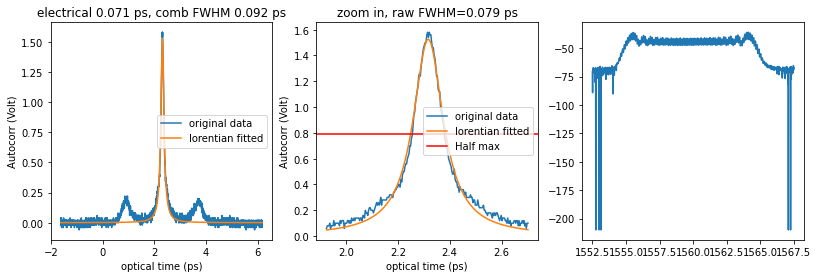

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.240_biaV_0.818_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

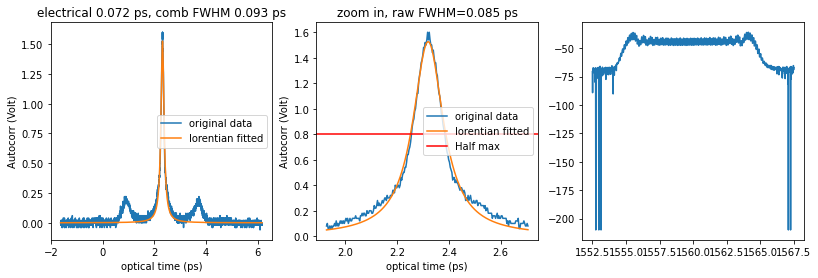

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.240_biaV_0.818_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

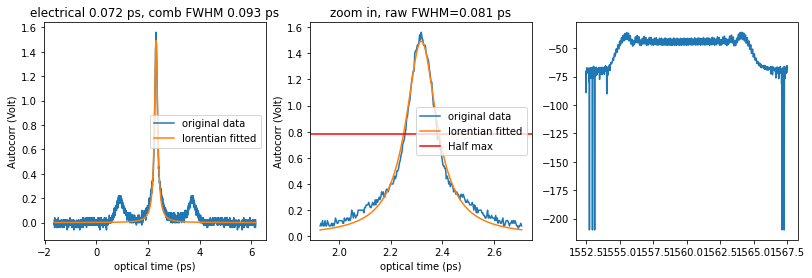

Waveshaper Set 3rd disper with d2=2.25 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.250_biaV_0.820_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

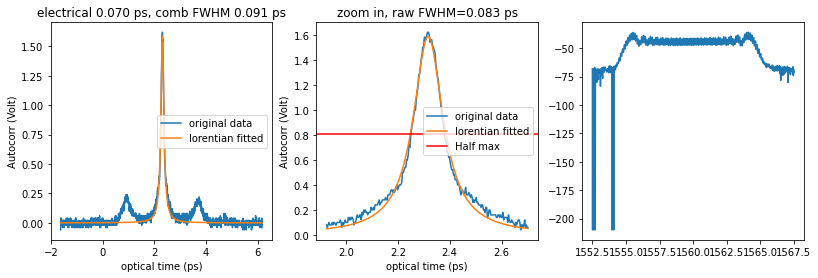

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.250_biaV_0.820_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

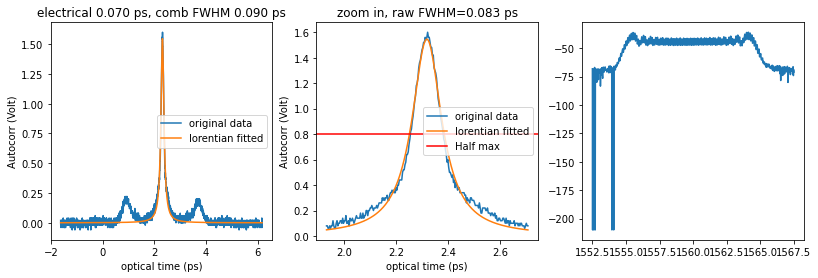

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.250_biaV_0.820_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

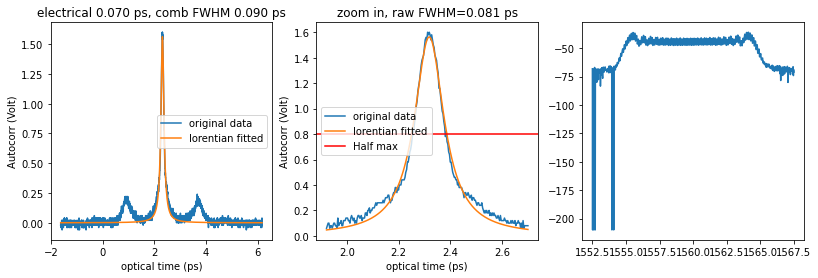

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.250_biaV_0.820_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

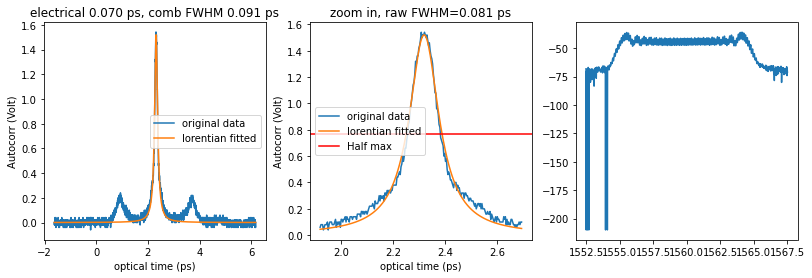

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.250_biaV_0.820_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

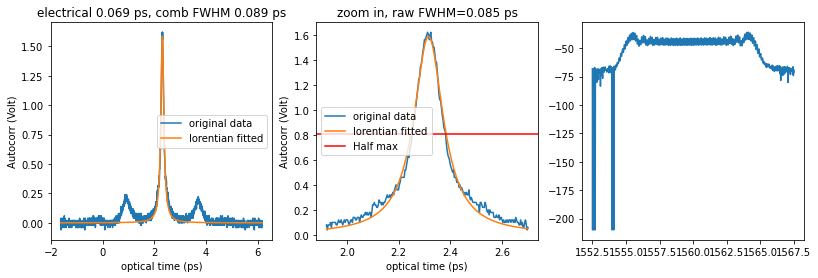

Waveshaper Set 3rd disper with d2=2.2600000000000002 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.260_biaV_0.820_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

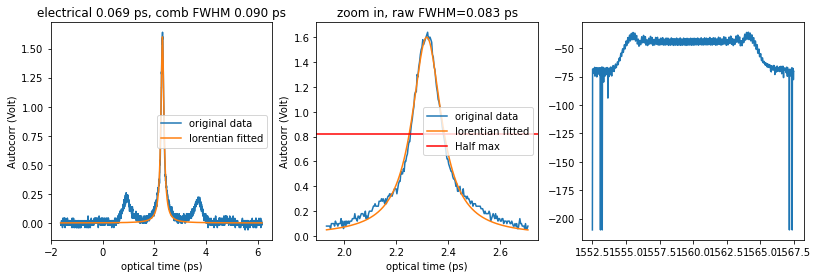

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.260_biaV_0.820_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

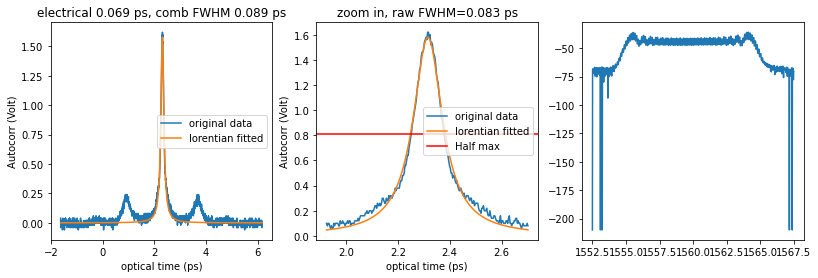

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.260_biaV_0.820_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

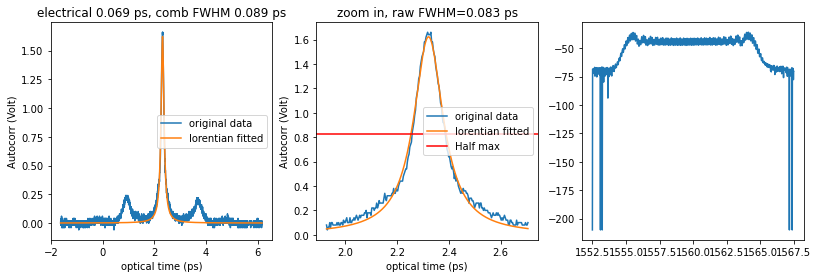

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.260_biaV_0.820_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

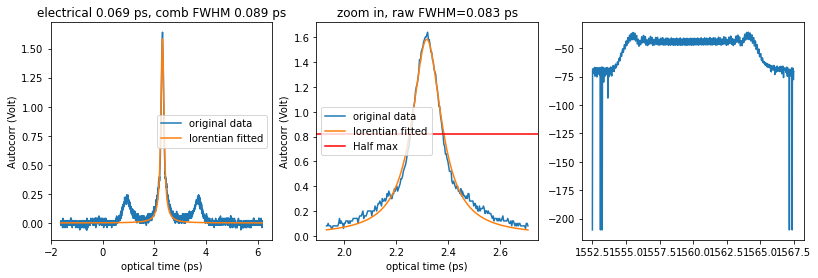

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.260_biaV_0.820_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

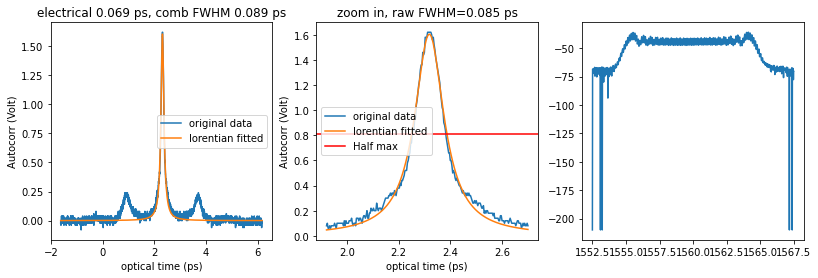

Waveshaper Set 3rd disper with d2=2.27 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.270_biaV_0.821_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

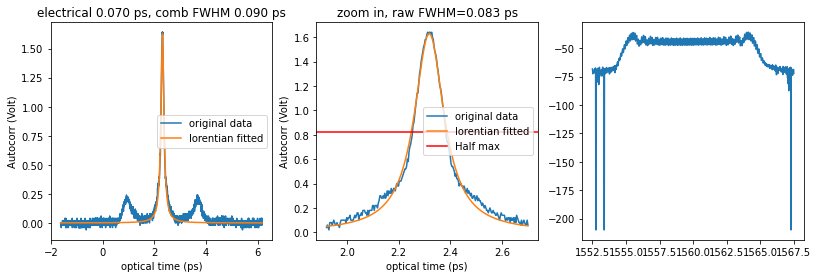

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.270_biaV_0.821_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

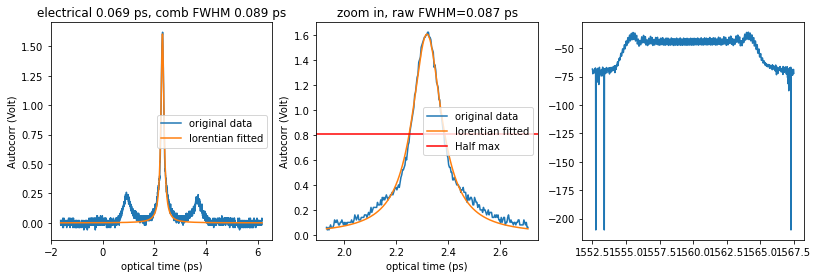

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.270_biaV_0.821_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

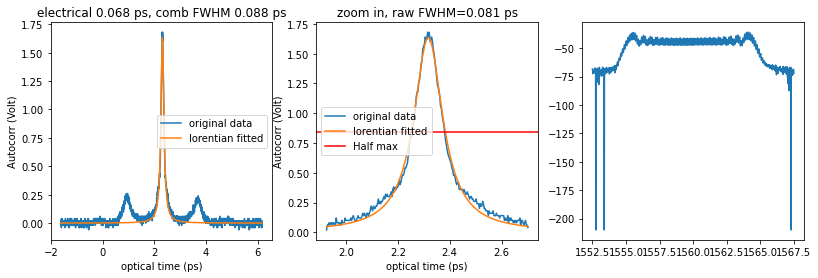

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.270_biaV_0.821_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

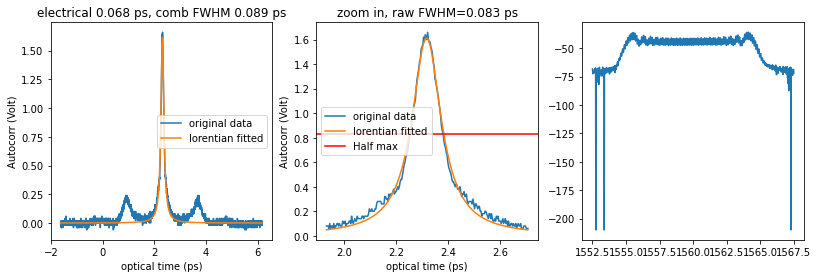

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.270_biaV_0.821_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

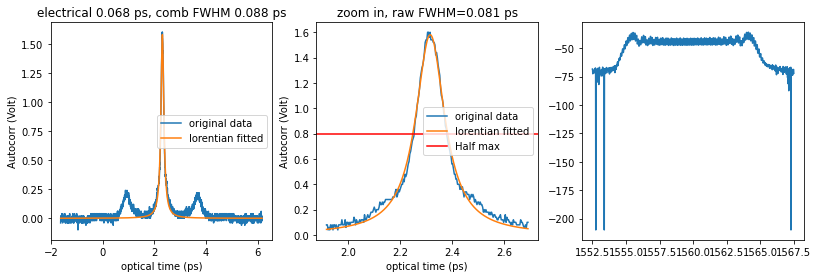

Waveshaper Set 3rd disper with d2=2.2800000000000002 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.280_biaV_0.821_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

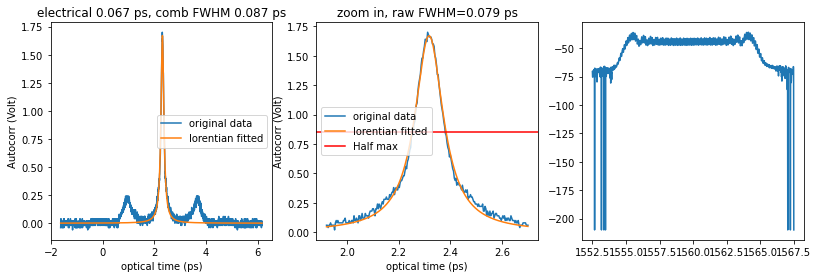

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.280_biaV_0.821_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

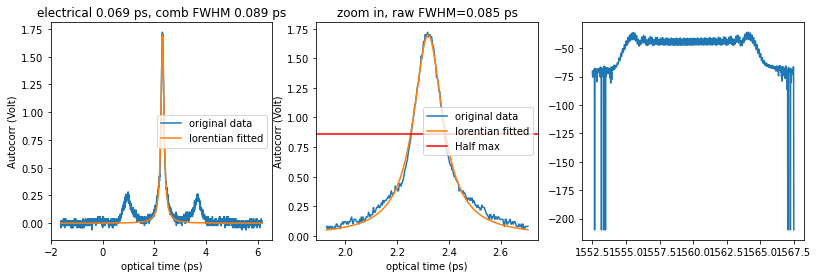

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.280_biaV_0.821_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

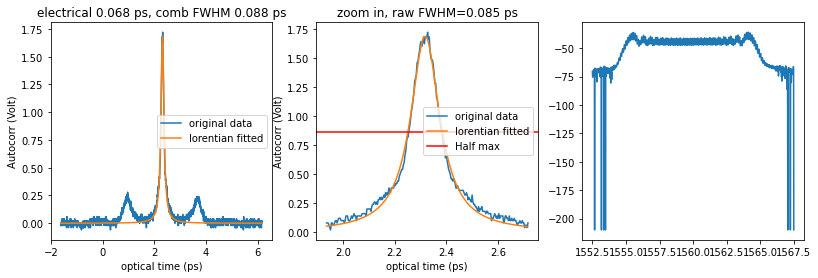

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.280_biaV_0.821_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

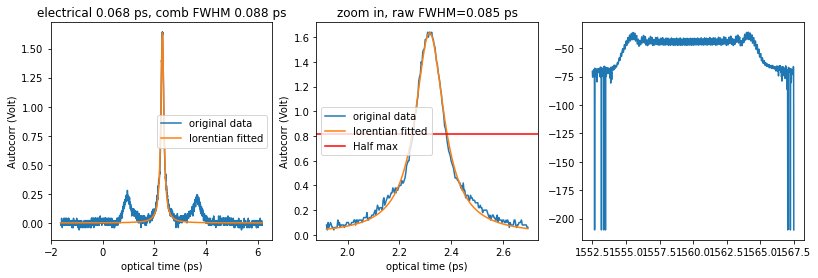

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.280_biaV_0.821_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

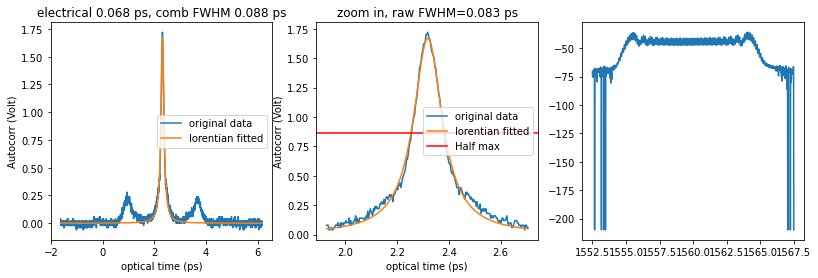

Waveshaper Set 3rd disper with d2=2.29 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.290_biaV_0.818_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

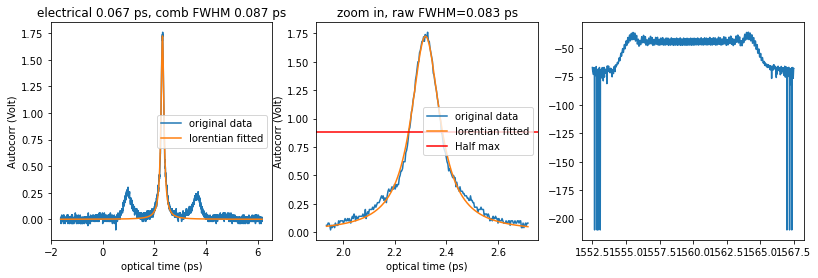

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.290_biaV_0.818_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

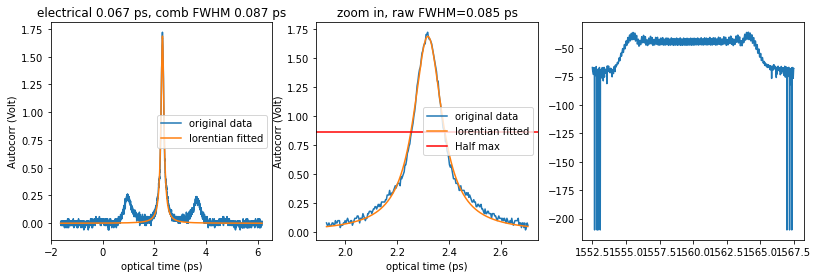

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.290_biaV_0.818_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

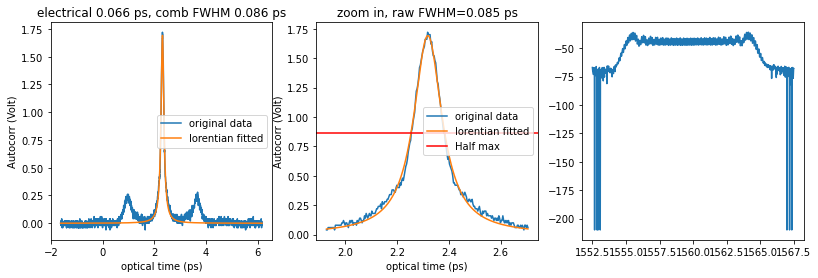

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.290_biaV_0.818_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

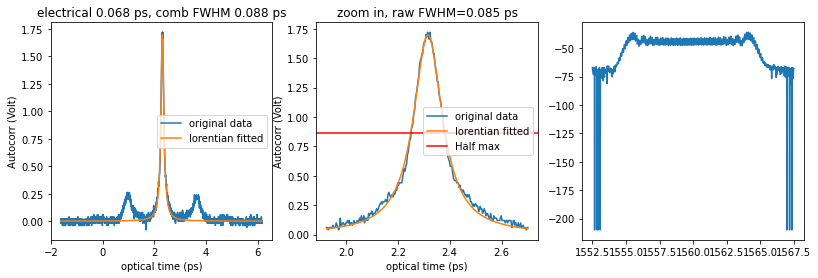

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.290_biaV_0.818_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

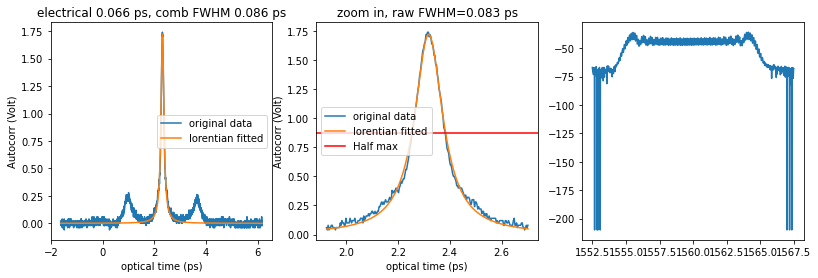

Waveshaper Set 3rd disper with d2=2.3000000000000003 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.300_biaV_0.820_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

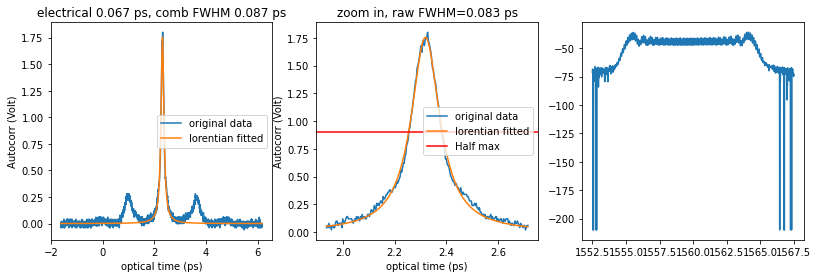

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.300_biaV_0.820_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

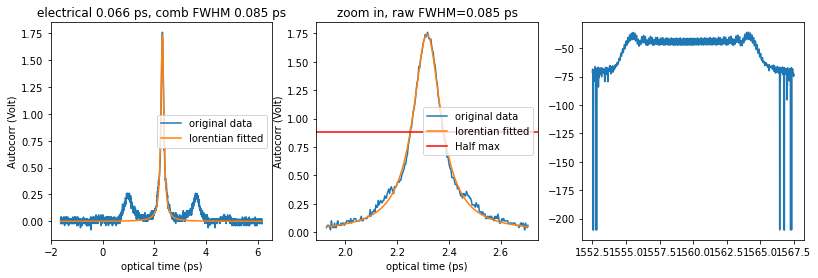

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.300_biaV_0.820_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

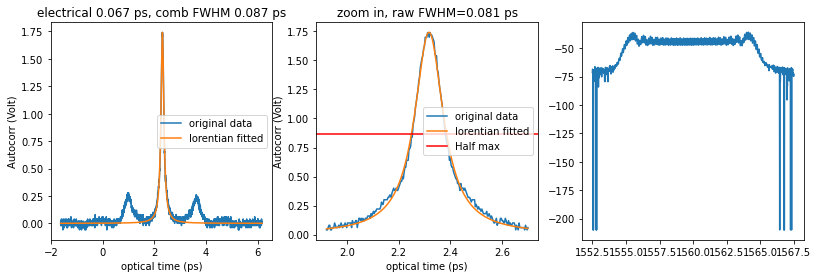

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.300_biaV_0.820_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

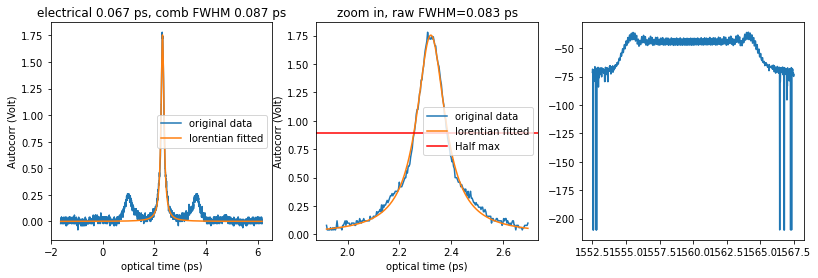

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.300_biaV_0.820_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

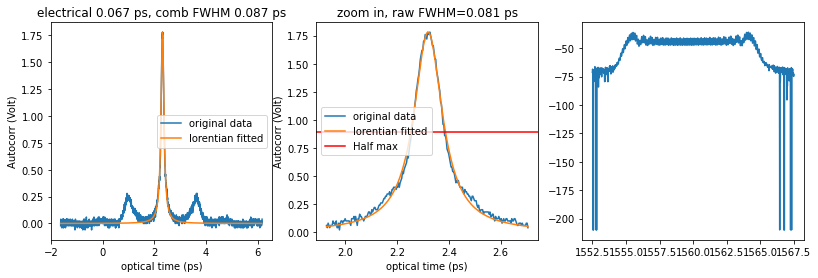

Waveshaper Set 3rd disper with d2=2.31 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.310_biaV_0.820_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

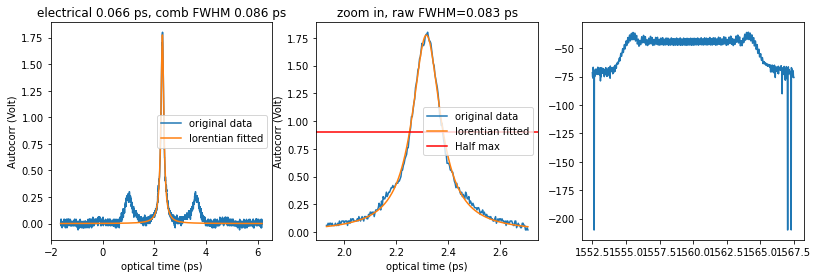

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.310_biaV_0.820_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

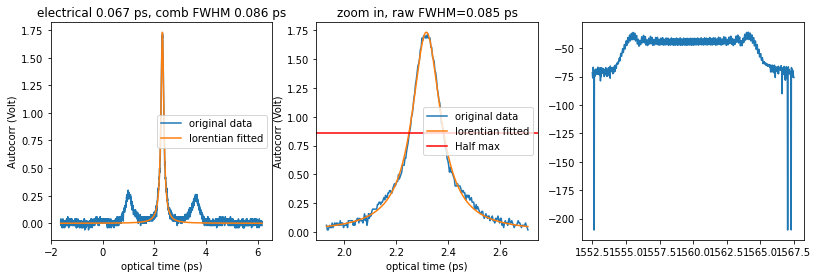

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.310_biaV_0.820_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

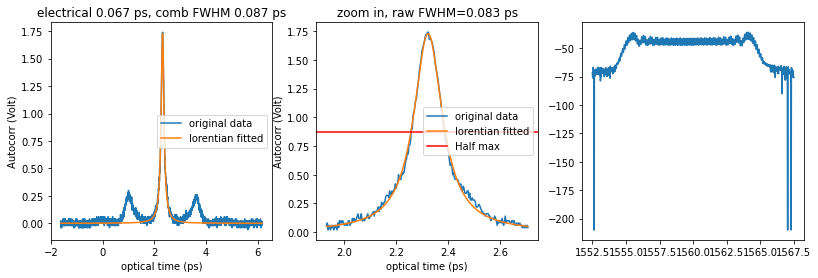

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.310_biaV_0.820_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

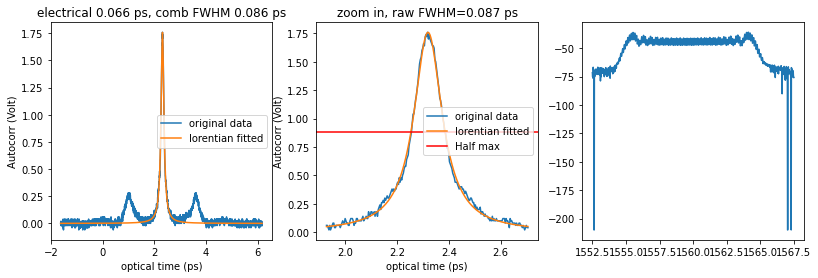

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.310_biaV_0.820_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

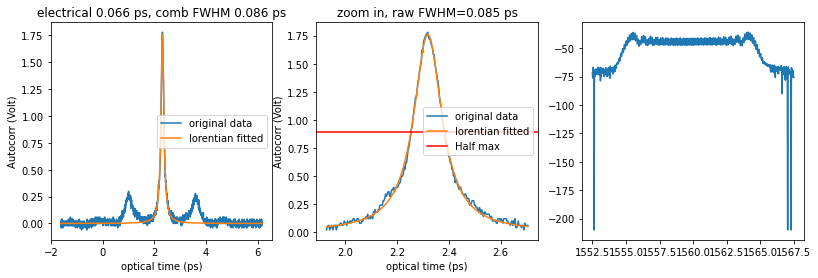

Waveshaper Set 3rd disper with d2=2.3200000000000003 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.320_biaV_0.822_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

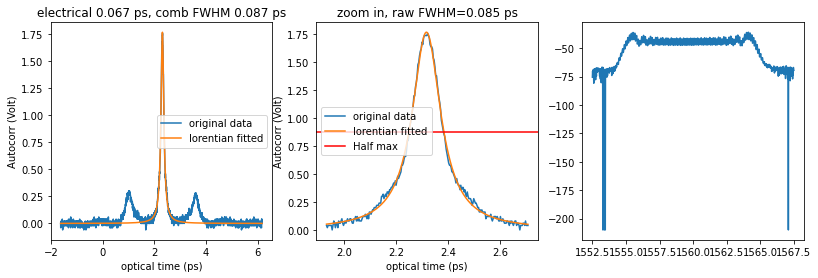

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.320_biaV_0.822_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

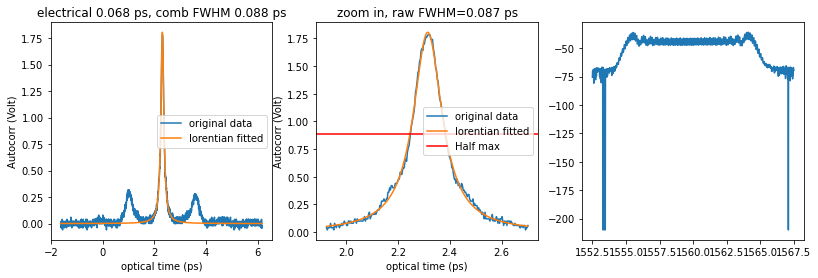

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.320_biaV_0.822_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

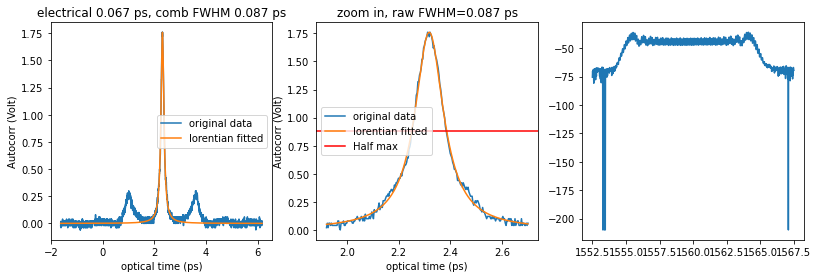

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.320_biaV_0.822_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

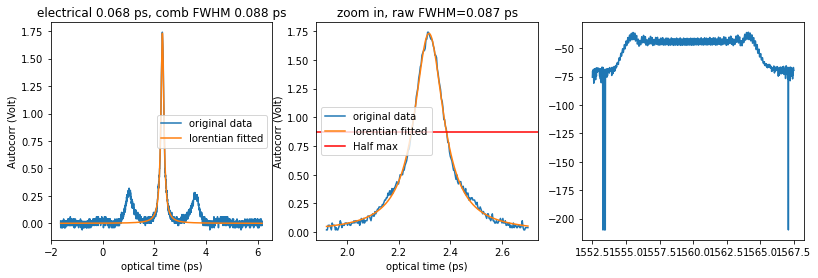

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.320_biaV_0.822_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

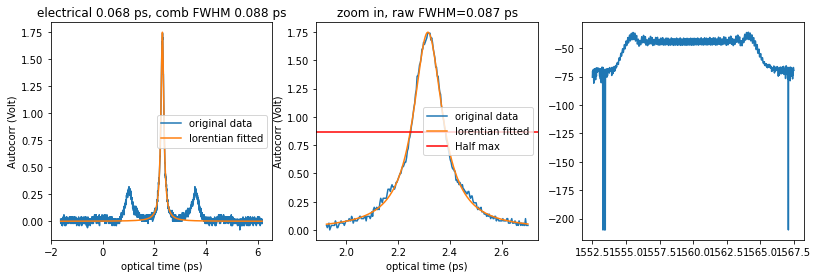

Waveshaper Set 3rd disper with d2=2.33 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.330_biaV_0.820_pwr_3.79_A_1.mat


<Figure size 432x288 with 0 Axes>

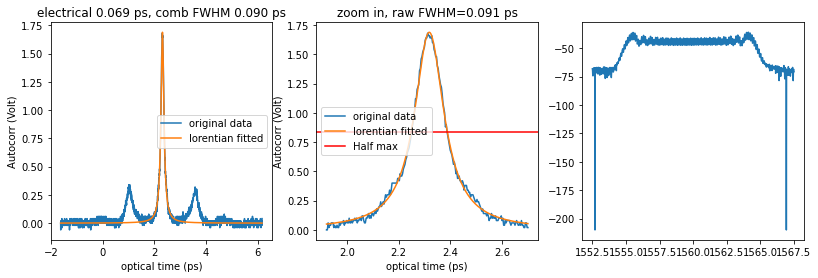

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.330_biaV_0.820_pwr_3.79_A_2.mat


<Figure size 432x288 with 0 Axes>

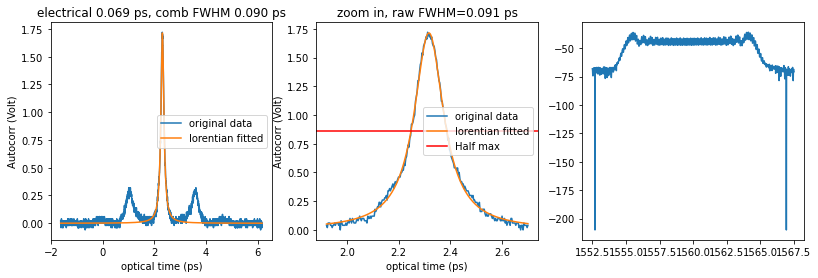

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.330_biaV_0.820_pwr_3.79_A_3.mat


<Figure size 432x288 with 0 Axes>

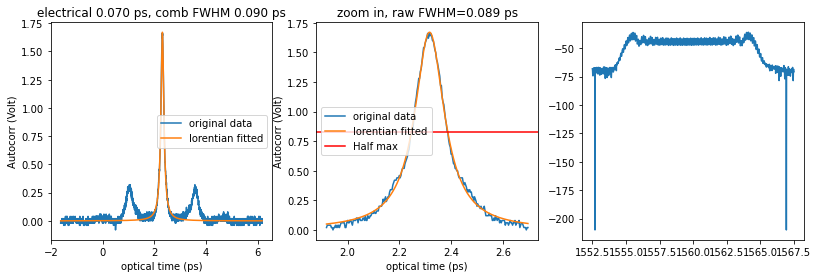

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.330_biaV_0.820_pwr_3.79_A_4.mat


<Figure size 432x288 with 0 Axes>

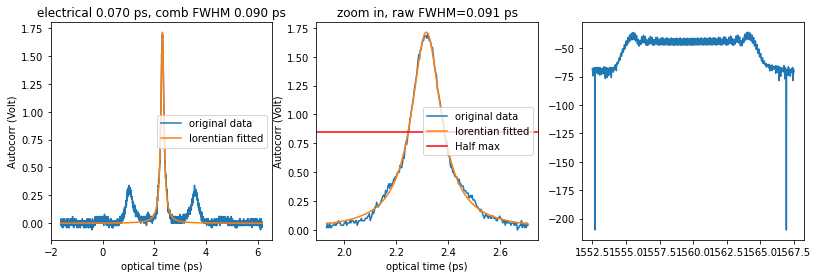

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.330_biaV_0.820_pwr_3.79_A_5.mat


<Figure size 432x288 with 0 Axes>

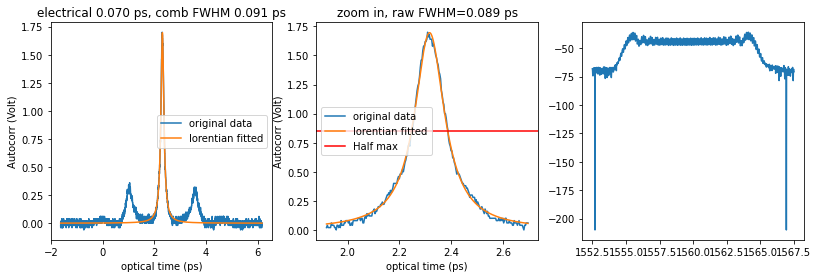

Waveshaper Set 3rd disper with d2=2.34 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.340_biaV_0.820_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

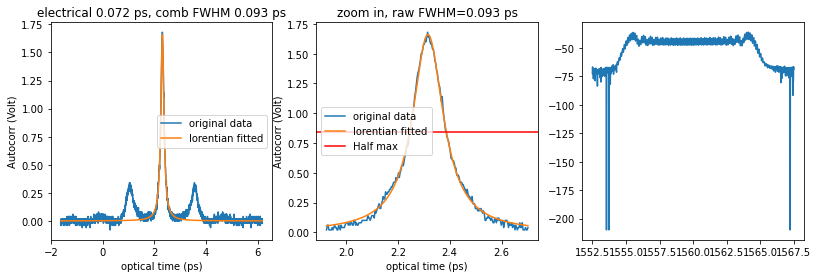

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.340_biaV_0.820_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

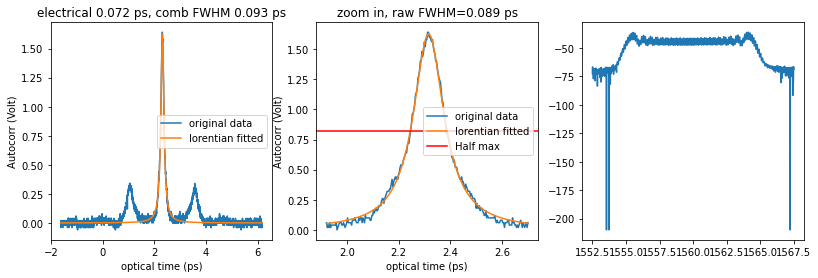

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.340_biaV_0.820_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

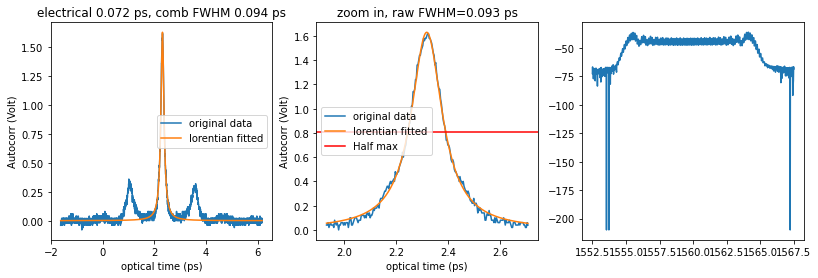

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.340_biaV_0.820_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

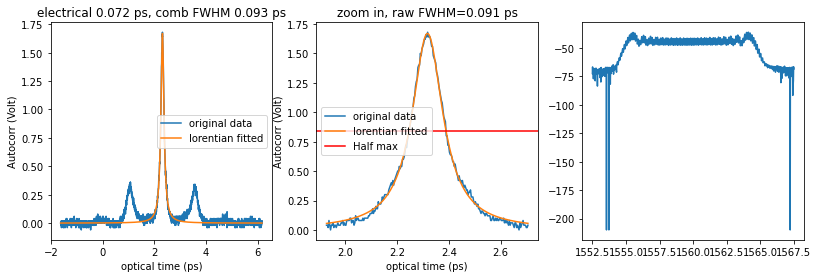

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.340_biaV_0.820_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

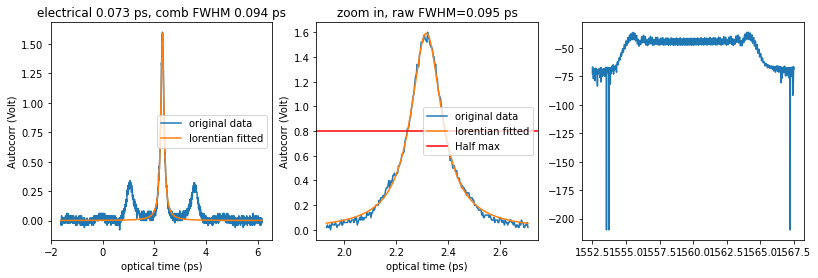

Waveshaper Set 3rd disper with d2=2.35 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.350_biaV_0.822_pwr_3.78_A_1.mat


<Figure size 432x288 with 0 Axes>

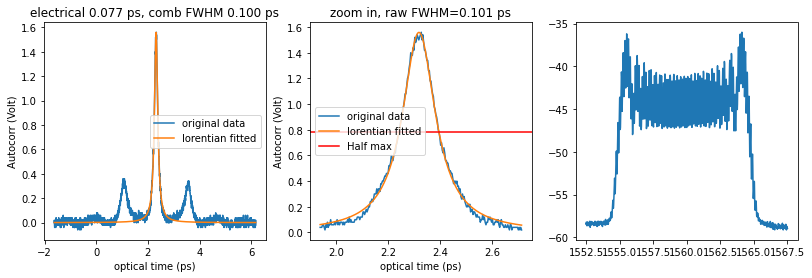

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.350_biaV_0.822_pwr_3.78_A_2.mat


<Figure size 432x288 with 0 Axes>

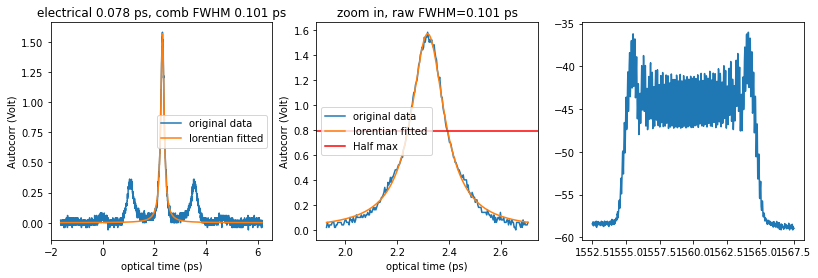

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.350_biaV_0.822_pwr_3.78_A_3.mat


<Figure size 432x288 with 0 Axes>

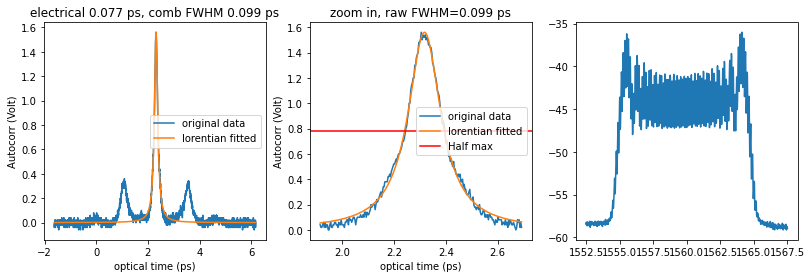

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.350_biaV_0.822_pwr_3.78_A_4.mat


<Figure size 432x288 with 0 Axes>

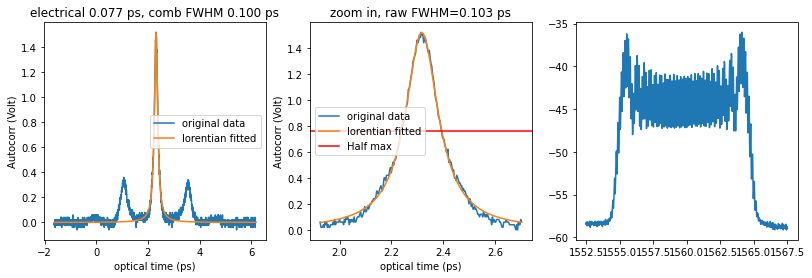

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp3.60W\\disp2_2.350_biaV_0.822_pwr_3.78_A_5.mat


<Figure size 432x288 with 0 Axes>

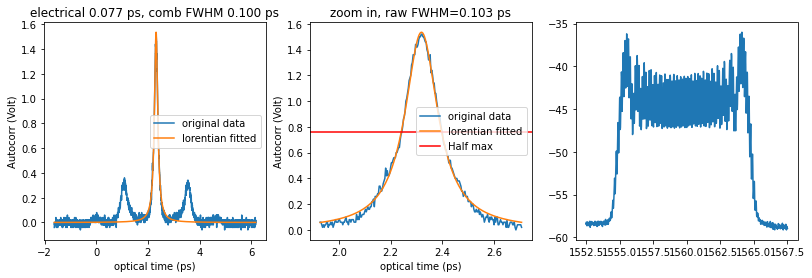

<Figure size 432x288 with 0 Axes>

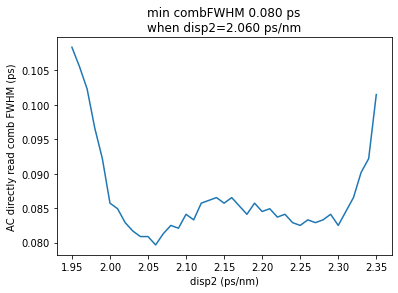

In [81]:
import numpy as np
import matplotlib.pyplot as plt
pwr = lfc.ptamp.outputPwr_mW/1e3 # ptamp output in Watt
filedir = r"Z:\Maodong\Projects\Keck\Compression Stage test\20221020\NewPaul0.2m_3_fine_AC10fs_ptamp"+f"{pwr:.2f}"+r"W\\"

fit_result = []
raw_result = []
# biaV_list = np.linspace(1.1,1.3,5)
# biaV = servo2.output_voltage
# disp2_list= np.linspace(2.05, 2.2, 16)
# disp2_list= np.linspace(1.8, 2.1, 31)
disp2_list= np.linspace(1.95, 2.35, 41)

# for ii,biaV in enumerate(biaV_list):
#     lfc.RFoscPS.Vset1 = biaV
#     FWHM_list = []
for jj, disp2 in enumerate(disp2_list):
    lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
    lfc.wsp.setBandPass(span=5)# ws.plotStatus()
    lfc.wsp.writeProfile()

    pw_list = []
    pw_raw_list = []
    filename = f"disp2_{disp2:.3f}_biaV_{servo2.output_voltage:.3f}_pwr_{lfc.ptamp.pwrAmp/1000:.2f}_A"
    spec = osa.get_trace('c', plot=False)
    for kk in range(5):
        pw,_, fig, raw_pw = osc.get_autocorr_FWHM_single(filename=filedir+filename+f"_{kk+1:.0f}.mat",
                        fit_range=250,
                        additional_plotdata=spec)
        pw_list.append(pw)
        pw_raw_list.append(raw_pw)
        plt.draw()
    fit_result.append(pw_list)
    raw_result.append(pw_raw_list)
    
    
to_save = {'fit_result':fit_result,'raw_result':raw_result, 'disp2_list':disp2_list}
from scipy.io import savemat
savemat(filedir+'results.mat', to_save)

###### Plot results begins here
import matplotlib.pyplot as plt
result_mean = np.mean(np.array(raw_result),axis=1)
fig = plt.figure()
plt.plot(disp2_list, result_mean)
plt.xlabel("disp2 (ps/nm)")
plt.ylabel("AC directly read comb FWHM (ps)")
plt.title(f"min combFWHM {np.min(result_mean):.3f} ps\n"+
         f"when disp2={disp2_list[np.argmin(result_mean)]:.3f} ps/nm")
plt.show()
fig.savefig(filedir+'results.png')

In [85]:
disp2 = 2.06
lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
lfc.wsp.setBandPass(span=5)# ws.plotStatus()
lfc.wsp.writeProfile()

Waveshaper Set 3rd disper with d2=2.06 ps/nm, d3=-0.0 ps/nm^2, center 192.17465256410256 THz.
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.


In [34]:
# lfc.ptamp.preAmp = '00mA'
# lfc.ptamp.pwrAmp = '0.A'

In [2]:
# disp2 = 2.05

# lfc.ptamp.ramp_pwr_ma = 50
# lfc.ptamp.ramp_pre_ma = 50
# lfc.ptamp.pwrAmp = 0
# lfc.ptamp.preAmp = 0

# lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
# lfc.wsp.setBandPass(span=5)# ws.plotStatus()
# lfc.wsp.writeProfile()

# time.sleep(5)

# lfc.ptamp.ramp_pwr_ma=50
# lfc.ptamp.ramp_pre_ma=50
# lfc.ptamp.preAmp = '600mA'
# lfc.ptamp.pwrAmp = '3.8A'

In [19]:
# rio.printStatus()
# lfc.RFoscPS.Vset1=0
# lfc.RFoscPS.activation=1


In [15]:
rio.printStatus()

0
1
0
-----------------------ORION Laser Module Status Summary------------------------
-------------Product ID: RIO0175-3-22-4-CJ5, Ver 0.11.7, SN: 811177-------------
|	 Status Code: bytearray(b'\x00\x01\x00\x01\x00\x01')
|	 Photo monitor voltage: 0.581 Volt (also mA, r=1kOhm)
|	 Board Temp:   29.1285 °C
|	 Thermis Temp: 22.7656 °C
|	 Volatile Settings (reset to non-volatile after re-plug): 
|		 Diode Cur = 165.0000 mA, TEC Set = 22.859°C
|	 Non Volatile Settings (Doesn't reset after re-plug): 
|		 Diode Cur = 145.0000 mA, TEC Set = 22.859°C
---------------------ORION Laser Module Status Summary Ends---------------------


"-----------------------ORION Laser Module Status Summary------------------------\n-------------Product ID: RIO0175-3-22-4-CJ5, Ver 0.11.7, SN: 811177-------------\n|\t Status Code: bytearray(b'\\x00\\x01\\x00\\x01\\x00\\x01')\n|\t Photo monitor voltage: 0.581 Volt (also mA, r=1kOhm)\n|\t Board Temp:   29.1285 °C\n|\t Thermis Temp: 22.7656 °C\n|\t Volatile Settings (reset to non-volatile after re-plug): \n|\t\t Diode Cur = 165.0000 mA, TEC Set = 22.859°C\n|\t Non Volatile Settings (Doesn't reset after re-plug): \n|\t\t Diode Cur = 145.0000 mA, TEC Set = 22.859°C\n---------------------ORION Laser Module Status Summary Ends---------------------"

In [18]:
# osa.save_trace('b', r'Z:\Maodong\Projects\Keck\F0 locking\rio-clarity-beat')